# **Protocol title: Prediction of intercellular communication networks using CellComm**
#### *Cell communication analysis in spatial transcriptomics (ST) using CellComm*

Compiled: 2022-02-10

# **Authors**
Edroaldo Lummertz da Rocha<sup>1+</sup>, Caroline Kubaczka<sup>2,3,4+</sup>, Wade W. Sugden<sup>2,3</sup>, Mohamad Najia<sup>2,3,4,5,6</sup>, Ran Jing<sup>2,3,4</sup>, Arianna Markel<sup>2,3,4</sup>, Zachary LeBlanc<sup>2,3</sup>, Rafael dos Santos Peixoto<sup>7</sup>, Marcelo Falchetti<sup>8</sup>, James J. Collins<sup>5,6,9,10,11,12</sup>, Trista E. North<sup>2,3*</sup>, George Q. Daley<sup>2,3,4*</sup>

Author Affiliations
- 1 Department of Microbiology, Immunology and Parasitology, Federal University of Santa Catarina, Florianópolis, SC, 88040-900, Brazil
- 2 Stem Cell Program, Boston Children's Hospital, Boston, MA 02115, USA
- 3 Division of Hematology/Oncology, Boston Children's Hospital and Dana Farber Cancer Institute, Boston, MA 02115, USA
- 4 Department of Biological Chemistry and Molecular Pharmacology, Harvard Medical School, Boston, MA 02115 USA 
- 5 Broad Institute of MIT and Harvard, Cambridge, MA, 02142, USA
- 6 Harvard-MIT Health Sciences & Technology, Massachusetts Institute of Technology
- 7 Undergraduate program in Automation and Control Engineering, Federal University of Santa Catarina, Florianópolis, SC, 88040-900, Brazil
- 8 Graduate Program of Pharmacology, Center for Biological Sciences, Federal University of Santa Catarina, Florianópolis, SC, 88040-900, Brazil
- 9 Wyss Institute for Biologically Inspired Engineering, Harvard University, Boston, MA, USA
- 10 Institute for Medical Engineering and Science, Massachusetts Institute of Technology, Cambridge, MA, USA
- 11 Department of Biological Engineering, Massachusetts Institute of Technology, Cambridge, MA, USA
- 12 Synthetic Biology Center, Massachusetts Institute of Technology, Cambridge, MA, USA

Corresponding Author: Edroaldo Lummertz da Rocha,

edroaldo.lummertz@ufsc.br / edroaldo@gmail.com

# **Overview**
Intercellular communication is important for tissue development and homeostasis, and when dysregulated contributes to a multitude of pathobiological processes. Cells communicate with each other by several mechanisms, including direct cell-cell contacts between membrane-tethered ligands and receptors on the cell surface, through secreted molecules which bind their cognate receptor on the receiving cell, or alternative modalities such as exosomes. The study of cell-cell communication networks using single-cell genomic approaches is now under intensive investigation, and innovative algorithms to interpret the data, infer how cells interact, and identify the downstream effectors of a putative binding of a ligand to its cognate receptor are critically needed. Here, we describe a protocol to run CellComm, a data-driven systems biology algorithm that integrates single cell RNA-sequencing, protein interaction networks and gene regulatory networks to infer which cells within a heterogeneous tissue are actively communicating, as well as their downstream transcriptional programs. When spatial transcriptomics data is available, CellComm additionally identifies spatially-resolved cell-cell interactions within the tissue. 

# **Keywords**
**spatial transcriptomics, cellular communication, intracellular signaling, Visium 10X**

# **# Procedure**

# **Data**
To demonstrate the generalizability of CellComm, we applied it to ST data generated using the 10X Visium technology. This dataset was obtained from the article *Multimodal Analysis of Composition and Spatial Architecture in Human Squamous Cell Carcinoma* (*Cell* 182, 1661–1662) published by Andrew Ji and collaborators in 2020 [1]. This dataset profiled/analyzed the tumor and tumor microenvironment (TME) of cutaneous squamous cell carcinoma (cSCC). In summary, this work identified a tumor-specific keratinocyte (TSK) population that interacts with a fibrovascular niche.

# **Before starting...**
Before you start you should create a folder for your analyses. It must contain the folders *filtered_feature_bc_matrix* (containing the files matrix.mtx.gz, barcodes.tsv.gz and features.tsv.gz), *spatial* (containing the files aligned_fiducials. jpg, detected_tissue_image.jpg, scalefactors_json.json, tissue_hires_image.png, tissue_lowres_image.png and tissue_positions_list.csv) and a folder where the results (especially the figures) will be stored (here we called *results*).
The files contained in folders *filtered_feature_bc_matrix* and *spatial* are the outputs of **Visium 10X** technology and, therefore, it is possible to analyze any **Visium 10X dataset**.

## 1. Install *fusca* package - Framework for Unified Single-Cell Analysis.

In [ ]:
install.packages("devtools")
library("devtools")
devtools::install_github("edroaldo/fusca")

## 2. Load libraries.

In [ ]:
library("dplyr")
library("fusca")
library("igraph")
library("scales")
library("ggplot2")

library("IRdisplay") # Only needed here, in Jupyter Notebook (for plots)

## 3. Set the 1 - **working directory** as your **analysis folder** and 2 - **base directory** as your **results folder**

In [2]:
setwd("/workspace/Edroaldo/CellComm")

bd <- "results"

## 4. Create a **CellRouter object** containing expression and image information from ST data

Here we use the function *read10X* to read or organize the objects in folder *filtered_feature_bc_matrix*. Then we create the CellRouter object using the *CreateCellRouter* function and add the tissue image and data related to it using the *read10XImage* function.

Used parameters the *CreateCellRouter* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- min.genes = 100, defining the minimum number of genes that a cell must express to be considered.
- min.cells = 25, defining the minimum number of cells that a gene is expressed (*counts* > 0) to be considered.
- is.expr = 0, defining the minimum expression value (*counts*) a gene must have to be considered expressed.

Used parameters the *read10XImage* function:
- assay.type = "ST", defining spatial transcriptomics analysis.

In [3]:
sample_names <- c("Sample1")

data <- read10X("filtered_feature_bc_matrix/")

image_paths  <- c("spatial/tissue_lowres_image.png")
scalefactor_paths <- c("spatial/scalefactors_json.json")
tissue_paths <- c("spatial/tissue_positions_list.csv")

cellrouter <- CreateCellRouter(data, assay.type = "ST", 
                               min.genes = 100, min.cells = 25, is.expr = 0)

cellrouter <- read10XImage(cellrouter, assay.type = "ST",
                              sample_names, image_paths, scalefactor_paths, tissue_paths)

[1] 11608   729


cellrouter dimensions: 11608 genes x 729 spots

## 5. Preprocess the expression data

Here we use the function *FindVariableGenes* to identify the genes with the highest variance of expression, normalize and scale the expression data using the *Normalize* and *scaleData* functions and, for the last (*scaleData*), we use the 3000 most variable genes.

Used parameters the *FindVariableGenes* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- method = "coefficient_variation", defining the method for variable's identification.
- pvalue = "0.05", defining the *p*-value threshold for the considered genes. 

Used parameters the *Normalize* function:
- assay.type = "ST", defining spatial transcriptomics analysis.

Used parameters the *ScaleData* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- genes.use = character, defining the genes to center/scale. Here we used the 3000 most variable genes.
- blocksize = numeric, defining the size of the blocks in which genes will be scaled.

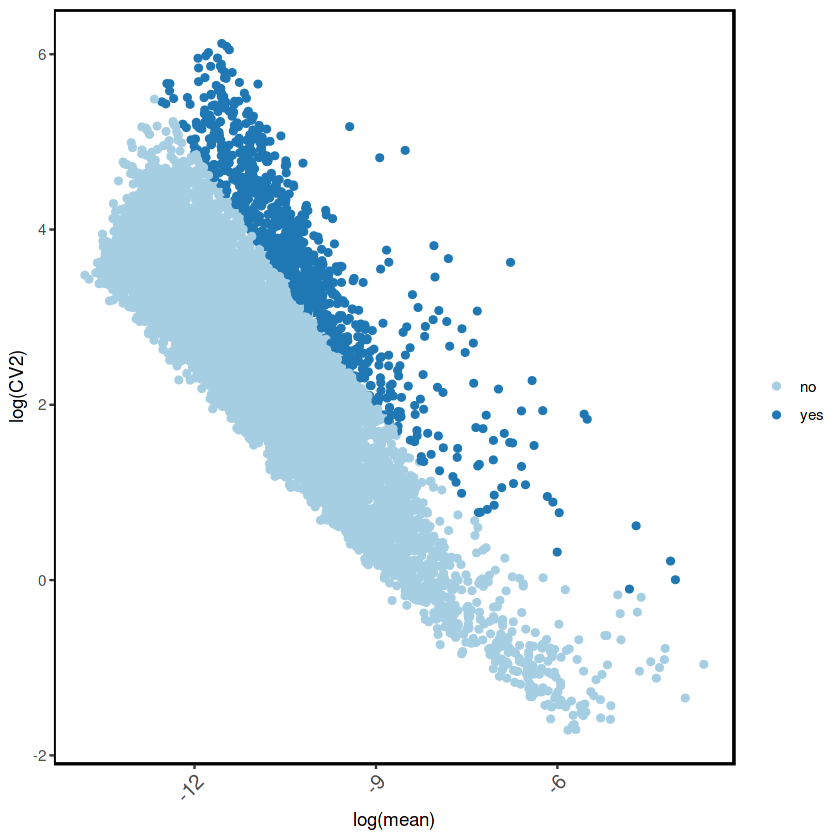

In [4]:
var.genes <- FindVariableGenes(cellrouter, assay.type = "ST", 
                               method = "coefficient_variation", pvalue = 0.05)

var.genes <- var.genes[order(var.genes$adj.pvalue, decreasing = FALSE), ]
cellrouter@var.genes <- rownames(var.genes[1:3000, ])

cellrouter <- Normalize(cellrouter, assay.type = "ST")

cellrouter <- scaleData(cellrouter, assay.type = "ST", 
                        genes.use = cellrouter@var.genes, blocksize = nrow(cellrouter@assays$ST@ndata))

Fig 1: Variable genes (dark blue) found in the CellRouter analysis

## 6. Dimensionality reduction and clustering

Then we reduce the dimensionality of the data using linear methods, with Principal Component Analysis (PCA) using the *computePCA* function and non-linear methods, with the t-Distributed Stochastic Neighbor Embedding (t-SNE) using the *computeTSNE* function and the Uniform Manifold Approximation and Projection (UMAP) using the *computeUMAP* function. As a next step we identified clusters defined by transcriptional variance and identified after dimensionality reduction using the *findClusters* function.

Used parameters the *computePCA* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- seed = X, sets the seed of R‘s random number generator, which is useful for creating simulations or random objects/analysis that can be reproduced.
- num.pcs = 50, defining the number of principal components to compute.
- genes.use = character; defining the genes to compute the PCA. Here we used the 3000 most variable genes.

Used parameters the *computeTSNE* function:
- seed = X, sets the seed of R‘s random number generator, which is useful for creating simulations or random objects/analysis that can be reproduced.
- num.pcs = 8, defining the number of principal components to compute.

Used parameters the *computeUMAP* function:
- seed = X, sets the seed of R‘s random number generator, which is useful for creating simulations or random objects/analysis that can be reproduced.
- num.pcs = 8, defining the number of principal components to compute.
- metric = "euclidean", defining the distances between data points to compute.
- n_neighbors = 15, defining the number of nearest neighbors. 
- spread = 1, defining the effective scale of embedded points.
- min_dist = 0.1, defining how close the points appear in the final layout.

Used parameters the *findClusters* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- num.pcs = 8, defining the number of principal components to compute.
- nn.type = "knn", defining the method to find the *k*-nearest neighbors graph.
- k = 20, defining the number of nearest neighbors to build a *k*-nearest neighbors graph.

In [5]:
cellrouter <- computePCA(cellrouter, assay.type = "ST", 
                         seed = 42, num.pcs = 50, genes.use = cellrouter@var.genes) 
plot(cellrouter@pca$sdev)

cellrouter <- computeTSNE(cellrouter, 
                          seed = 1, num.pcs = 8, max_iter = 1000)

cellrouter <- computeUMAP(cellrouter, 
                          seed = 1, num.pcs = 8, metric = "euclidean", n_neighbors = 15, spread = 1, min_dist = 0.1)

cellrouter <- findClusters(cellrouter, assay.type = "ST", 
                           num.pcs = 8, nn.type = "knn", k = 20)

Graph-based clustering
k:  20 
similarity type:  jaccard 
number of principal components:  8 
[1] "building k-nearest neighbors graph"
[1] "discoverying subpopulation structure"
[1] "updating CellRouter object"


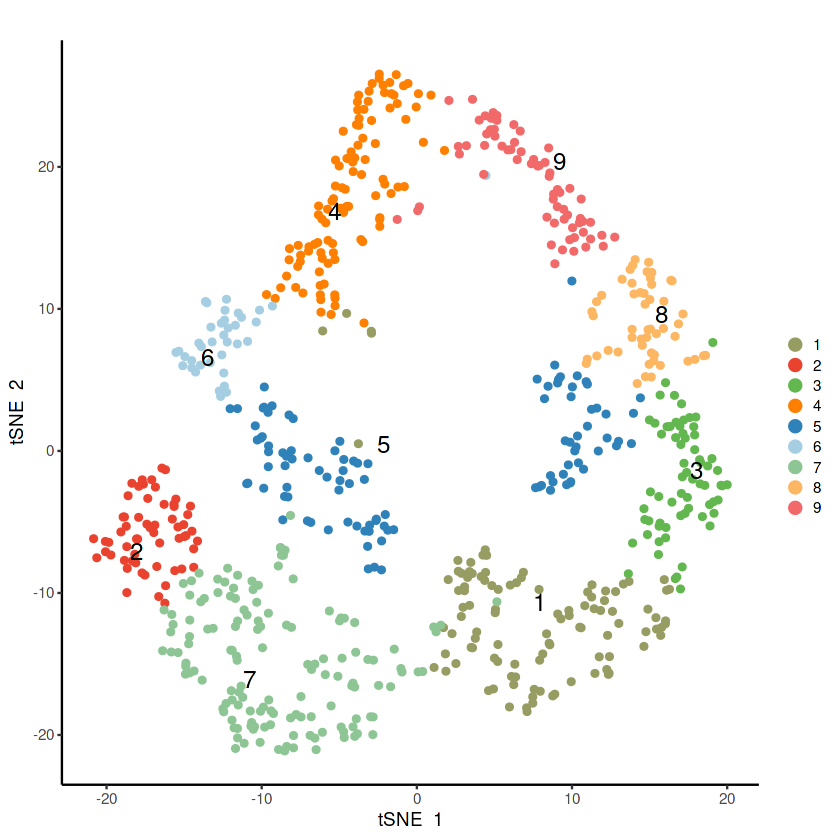

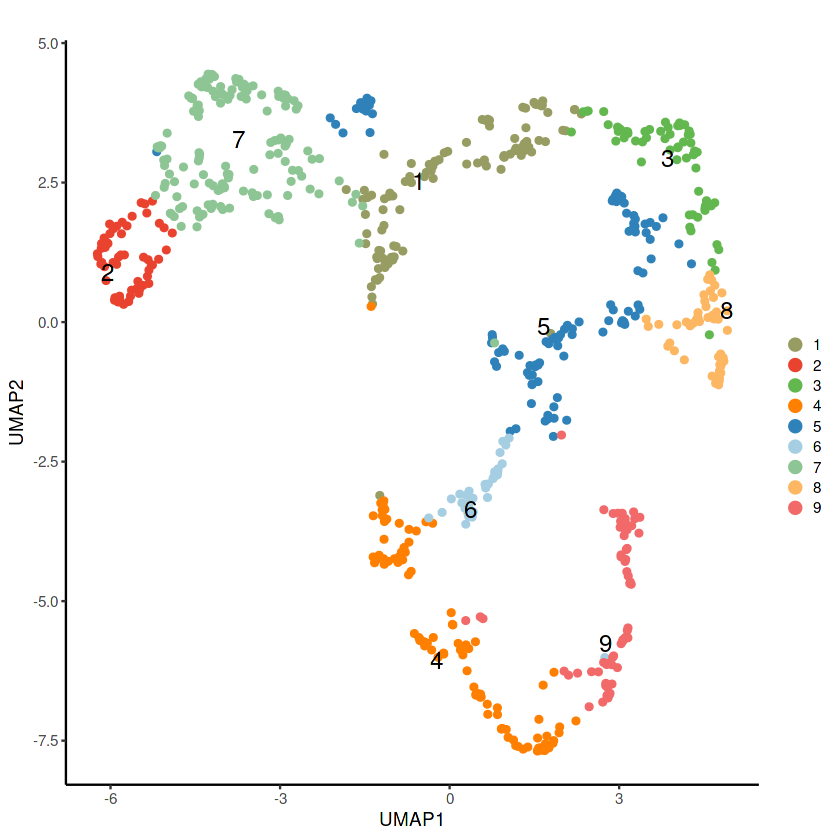

In [6]:
plotReducedDimension(cellrouter, assay.type = "ST", reduction.type = "tsne", annotation = "population", annotation.color = "colors",
                     dotsize = 1.5, showlabels = TRUE, labelsize = 5, convex = FALSE)

plotReducedDimension(cellrouter, assay.type = "ST", reduction.type = "umap", annotation = "population", annotation.color = 'colors',
                     dotsize = 1.5, showlabels = TRUE, labelsize = 5, convex = FALSE)

Fig. 1: Dimensionality reduction using t-Distributed Stochastic Neighbor Embedding (t-SNE).

Fig. 2: Dimensionality reduction using Uniform Manifold Approximation and Projection (UMAP).

**We analyzed ST data with CellComm and identified 9 spatially-resolved transcriptional clusters.**

## 7. Calculate the Tumor-Specific Keratinocytes (TSK) and Fibrovascular cell gene-sets score

Used parameters the *scoreGeneSets* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- genes.list = character, defining the genes to score. 
- bins = 25, defining the bin number to divide the expression data.

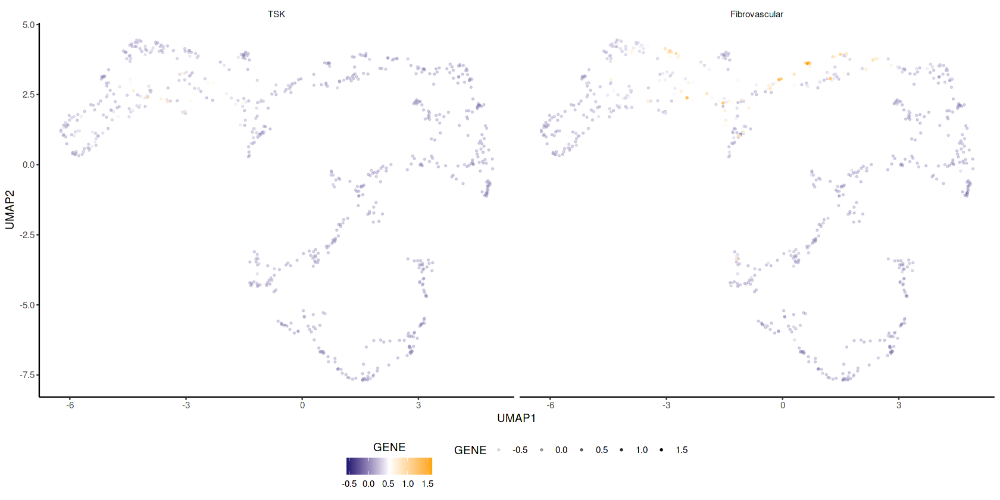

In [7]:
TSK <- c('FEZ1', 'IL24', 'INHBA', 'KCNMA', 'LAMC2', 'MAGEA4', 'MMP10', 'NT5E')
Fibrovascular <- c('CAV1', 'CD93', 'ENG', 'FN1', 'ITGB1')

genelist <- list(TSK = TSK, Fibrovascular = Fibrovascular)

cellrouter <- scoreGeneSets(cellrouter, assay.type = "ST", genes.list = genelist, bins = 25)

options(repr.plot.width = 14, repr.plot.height = 7)
plotSignatureScore(cellrouter, assay.type = "ST", names(genelist), reduction.type = 'umap', threshold = 2, columns = 2, dotsize=0.5)
options(repr.plot.width = 7, repr.plot.height = 7)

Fig. 1: TSK and Fibrovascular gene-sets score in dimensionality reduction using Uniform Manifold Approximation and Projection (UMAP).

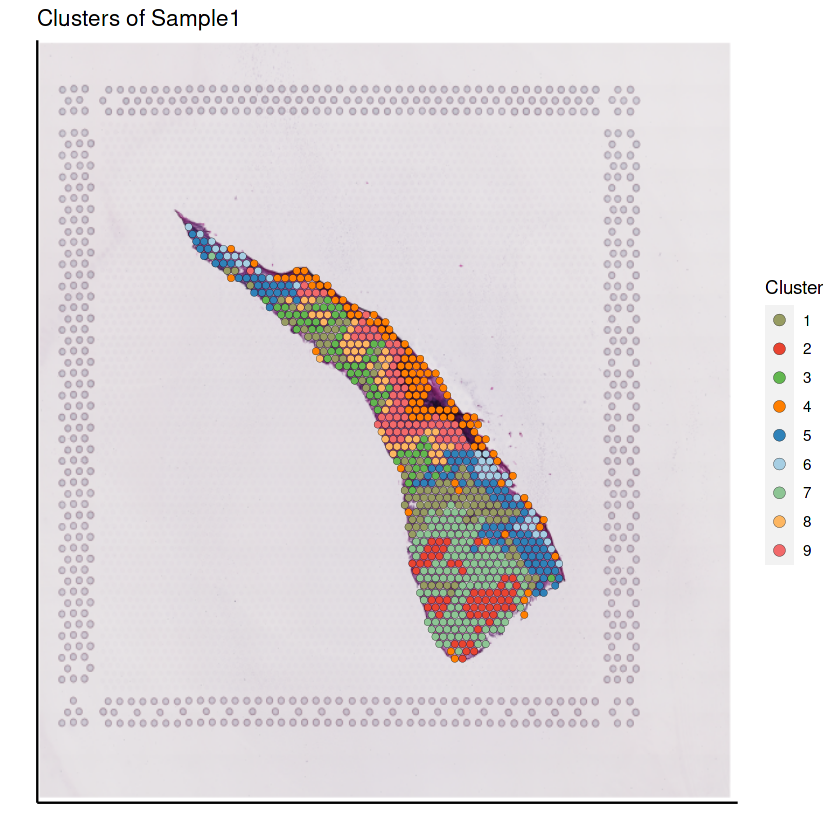

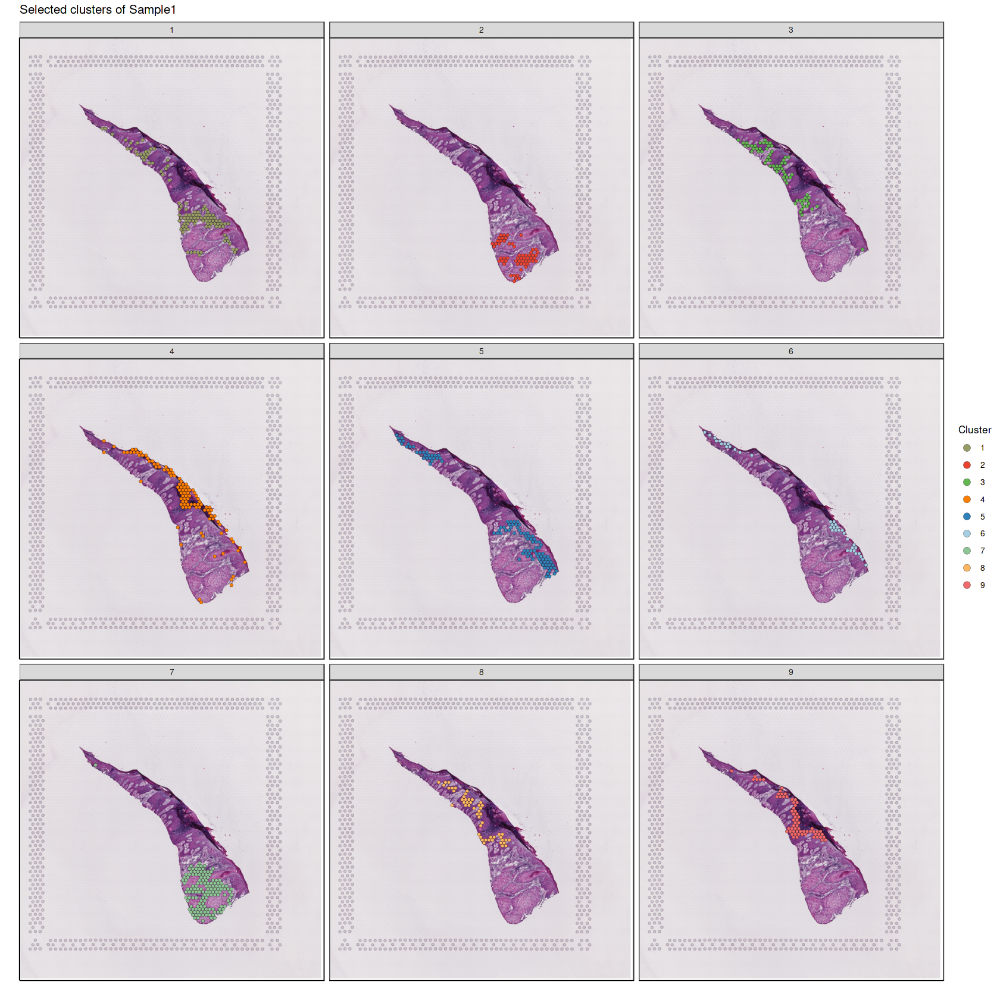

In [8]:
plotSpatialClusters(cellrouter, assay.type = "ST", sample.name = "Sample1",
                    cluster.column = "population", colors.column = "colors", point.size = 1.7,
                    annotate_centroids = FALSE, title = NULL)

options(repr.plot.width = 14, repr.plot.height = 14)
plotSelectedClusters(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                     cluster.column = "population", colors.column = "colors", point.size = 1.2,
                     annotate_centroids = FALSE, title = NULL, 
                     selected_clusters = list(c(as.character(1:9))), facets = TRUE, num.cols = 3)
options(repr.plot.width = 7, repr.plot.height = 7)

Fig. 1: All clusters overlaid on the image.

Fig. 2: Clusters overlaid on the image separately.

## 8. Transfer cell type annotations from the sc-RNAseq atlas of cSCC generated by Ji et al. 2020 to clusters identified from the ST data

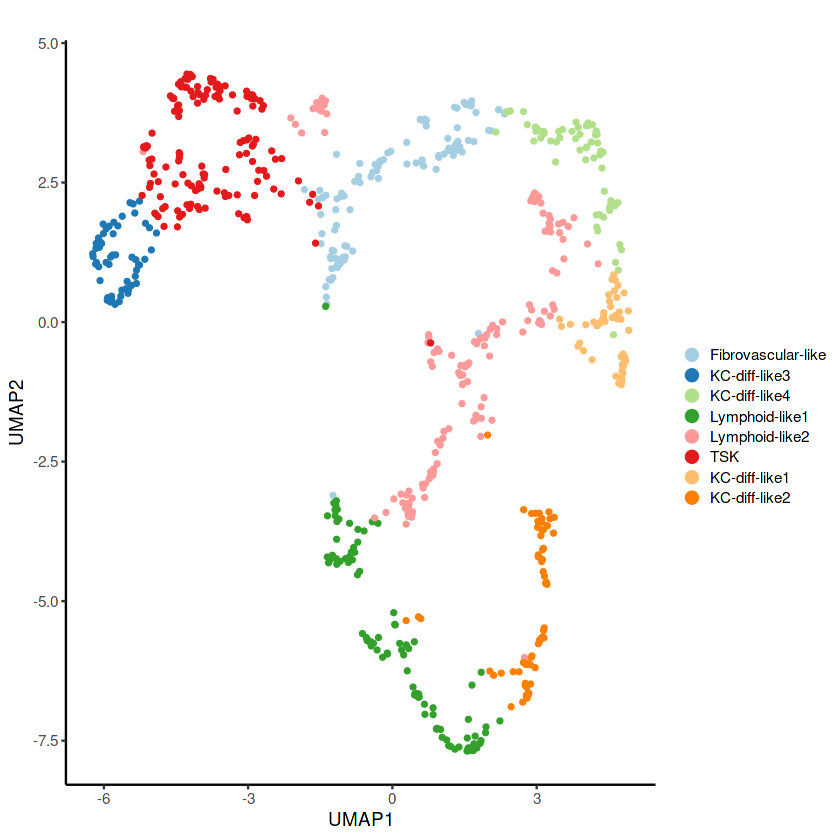

In [9]:
tmp <- recode(as.character(cellrouter@assays$ST@sampTab$population), 
              "1"="Fibrovascular-like", 
              "7"='TSK', 
              "4"="Lymphoid-like1", 
              "5"="Lymphoid-like2", 
              "6"="Lymphoid-like2", 
              "5"="Basal-like", # !
              "8"="KC-diff-like1", 
              "9"="KC-diff-like2",
              "2"="KC-diff-like3", 
              "3"="KC-diff-like4")
names(tmp) <- rownames(cellrouter@assays$ST@sampTab)

df <- data.frame(cluster = cellrouter@assays$ST@sampTab$population, celltype = tmp)
rownames(df) <- rownames(cellrouter@assays$ST@sampTab)

cellrouter <- addInfo(cellrouter, assay.type = "ST", sample.name = sample_names[[1]],
                      metadata = df, colname = "celltype",
                      metadata.column = "celltype")

plotReducedDimension(cellrouter, assay.type = 'ST', 
                     reduction.type = 'umap', annotation="celltype", annotation.color = 'celltype_color',
                     dotsize=1, showlabels = FALSE, labelsize=2.5, convex=FALSE)

Fig. 1: All clusters (renamed) in UMAP space.

**This analysis showed that cluster 7 is more highly similar to TSKs (Supplementary Fig. 8d,e). Clusters 1 and 4 showed similarities to fibroblast and endothelial cells, which we named a fibrovascular niche, to be consistent with findings from the original publication. Clusters 1, 4, 5 and 6 were more similar to B cells, while most of the clusters showed strong similarities to tumor keratinocytes undergoing differentiation, Tumor-KC-diff state. Based on this analysis, we annotated spatially-resolved transcriptomes.**

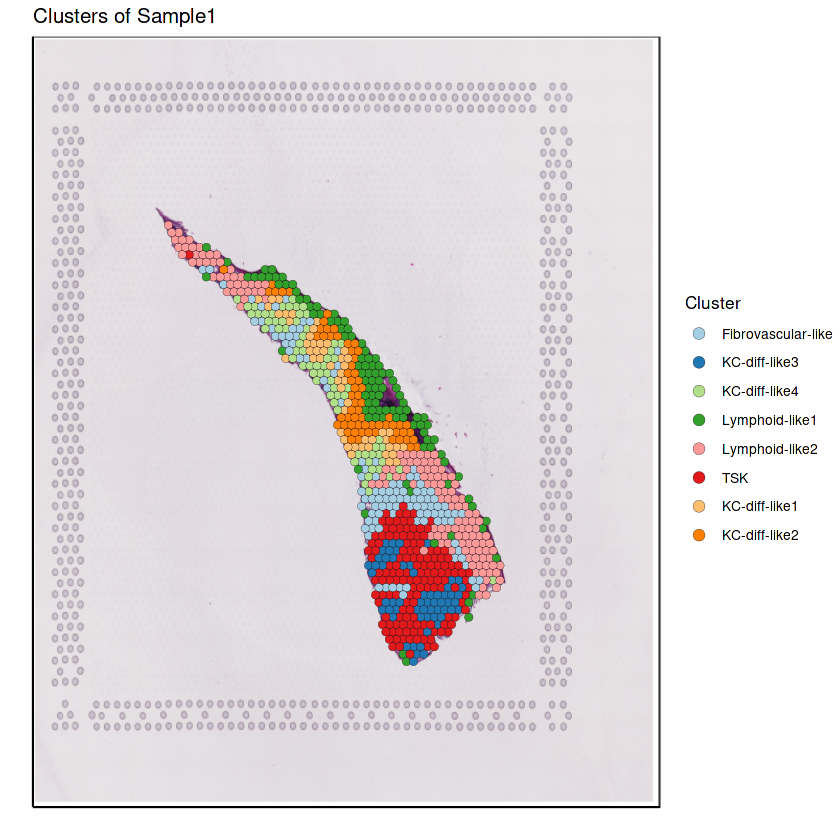

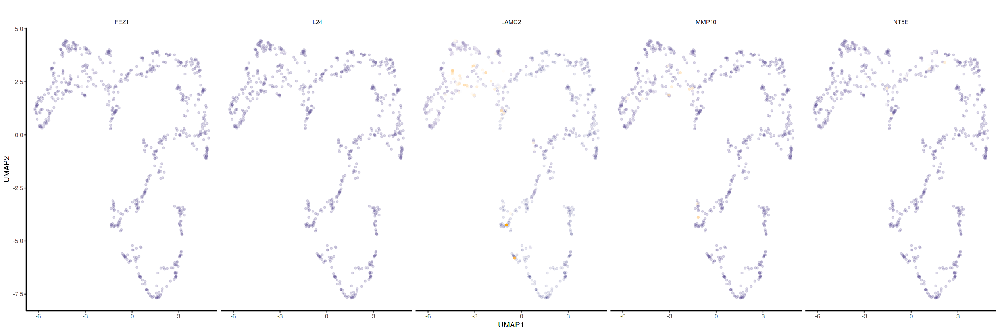

$TNC

$MMP9


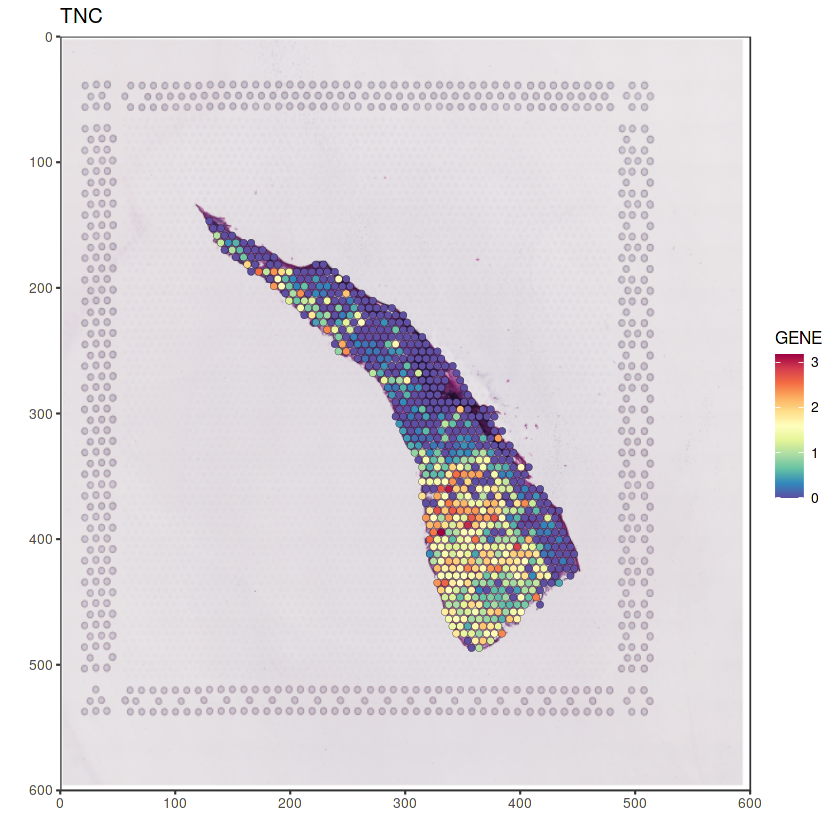

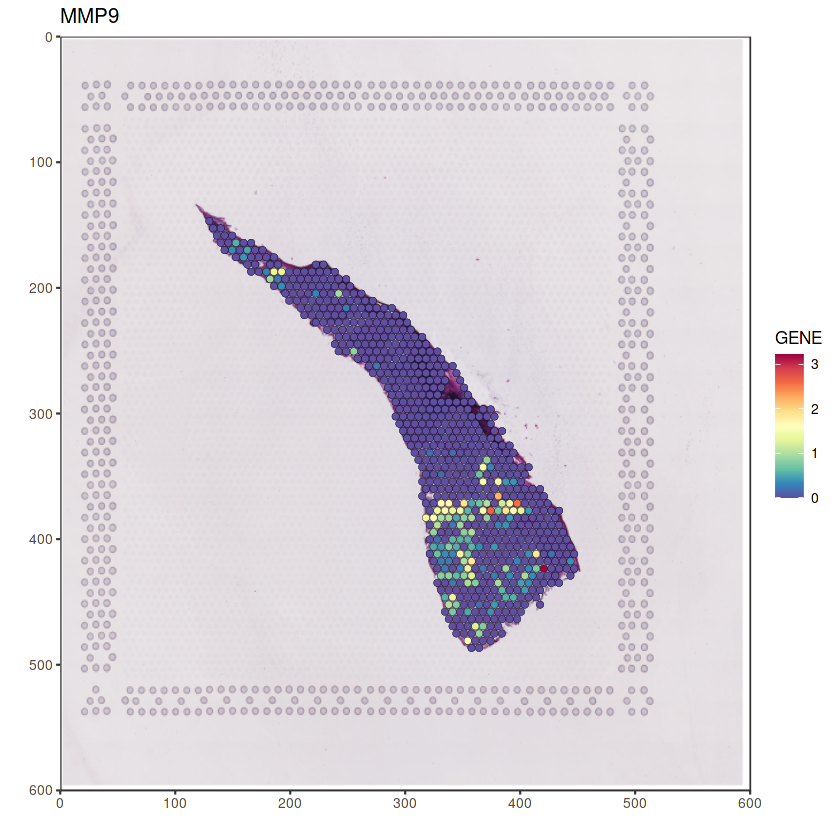

In [10]:
plotSpatialClusters(cellrouter, assay.type = "ST", sample.name = "Sample1",
                    cluster.column = "celltype", colors.column = "celltype_color", 
                    point.size = 2, title = NULL, annotate_centroids = FALSE)

options(repr.plot.width = 21, repr.plot.height = 7)
TSK <- c('FEZ1', 'IL24', 'LAMC2', 'MMP10', 'NT5E')
plotDRExpression(cellrouter, assay.type = "ST", 
                 reduction.type = "umap", dims.use = c(1, 2),
                 genelist = TSK[1:5], title = "", columns = 5, dotsize = 1, threshold = 5)
options(repr.plot.width = 7, repr.plot.height = 7)
TSK <- c('FEZ1', 'IL24', 'INHBA', 'KCNMA', 'LAMC2', 'MAGEA4', 'MMP10', 'NT5E')

gene_plots <- plotSpatialExpression(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                                    genes=c('TNC', 'MMP9'),
                                    point.size = 1.7)
gene_plots

Fig. 1: All clusters (renamed) overlaid on the image.

Fig. 2: Expression of *FEZ1*, *IL24*, *LAMC2*, *MMP10* and *NT5E* in UMAP space.

Fig. 3: Expression of *TNC* overlaid on the image. 

Fig. 4: Expression of *MMP9* overlaid on the image.

## 9. Identify cluster-specific gene signatures and marker genes

Used parameters the *findSignatures* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- column = "celltype", defining the column with the groups in metadata.
- pos.only = TRUE, defining to get only the up-regulated genes.
- fc.threshold = 0.2, defining the fold change threshold.

In [11]:
markers <- findSignatures(cellrouter, assay.type = "ST", 
                          column = "celltype", pos.only = TRUE, fc.threshold = 0.2); gc();

markers.top <- markers %>% group_by(population) %>% top_n(10, fc)
markers.top <- as.data.frame(markers.top)

plot <- plotSignaturesHeatmap(cellrouter, assay.type = 'ST', 
                              markers.top, genes.show = as.vector(markers.top$gene), 
                              column.ann = 'celltype', column.color  = 'celltype_color', 
                              num.cells = 700, threshold =  2)

Calculating fold changes... 
[1] "Identify cluster-specific gene signatures"
cluster  Fibrovascular-like 
[1] 2121
cluster  KC-diff-like3 
[1] 440
cluster  KC-diff-like4 
[1] 911
cluster  Lymphoid-like1 
[1] 1570
cluster  Lymphoid-like2 
[1] 354
cluster  TSK 
[1] 946
cluster  KC-diff-like1 
[1] 451
cluster  KC-diff-like2 
[1] 950
[1] "finding subpopulation markers"


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3392093,181.2,5987561,319.8,5987561,319.8
Vcells,21182933,161.7,49882316,380.6,49882316,380.6


In [12]:
save.image(file = "my_step_01.RData")

# **# CellComm in *cluster-cluster* communication**

Next, we used CellComm to infer spatially-informed cell-cell interactions by calculating an interaction score that takes into account the number of ligand-receptor interactions co-expressed between cell types and their spatial distances on the tissue.

## 10. Calculate the mean expression of ligands and receptors per cluster

Here we accessed a list of ligand-receptor interactions published by Robin Browaeys and collaborators in 2020 (NicheNet: modeling intercellular communication by linking ligands to target genes. Nat Methods 17, 159–162 (2020)) and averaged the expression of each ligand/receptor as well as the mean mean expression of these in each transcriptional clusters of the spots using the *computeValue* and *calculateObservedMean* functions.

Used parameters the *computeValue* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- genelist = character, defining the genes to use in the analysis.
- column = "celltype", defining the column with the groups in metadata.
- fun = "mean", statistical function to summary the gene expression data.

Used parameters the *population.pairing* function:
- mean.expr = mean.expr, object defined/calculated by the *computeValue* function. 
- pairs = pairs, object with ligands/receptors pairs.
- ligands = ligands, defining the list of genes annotated as ligands.
- receptors = receptors, defining the list of genes annotated as receptors.
- threshold = 0.25, threshold to select the genes in the population according to their mean expression.

Used parameters the *calculateObservedMean* function:
- mean.expr = mean.expr, object defined/calculated by the *computeValue* function.
- interactions = interactions, object defined/calculated by the *population.pairing* function.

Used parameters the *findSignatures* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- column = "celltype", defining the column with the groups in metadata.
- pos.only = TRUE, defining to get only the up-regulated genes.
- fc.threshold = 0.2, defining the fold change threshold.

In [13]:
lr_network = readRDS(url("https://zenodo.org/record/3260758/files/lr_network.rds"))# from NicheNet
head(lr_network)

pairs <- lr_network
pairs$Pair.Name <- paste(pairs$from, pairs$to, sep = "_")

ligands <- unique(lr_network$from)
ligands <- intersect(ligands, rownames(cellrouter@assays$ST@ndata))

receptors <- unique(lr_network$to)
receptors <- intersect(receptors, rownames(cellrouter@assays$ST@ndata))

ligands.receptors <- unique(c(ligands, receptors))

mean.expr <- computeValue(cellrouter, assay.type = "ST", 
                          genelist = ligands.receptors, "celltype", fun = "mean"); gc();

interactions <- population.pairing(mean.expr = mean.expr, pairs = pairs, ligands = ligands, receptors = receptors, threshold = 0.25)

interactions <- calculateObservedMean(mean.expr = mean.expr, interactions = interactions)
head(interactions)

markers <- findSignatures(cellrouter, assay.type = "ST", 
                          column = "celltype", pos.only = TRUE, fc.threshold = 0.2); gc();

from,to,source,database
<chr>,<chr>,<chr>,<chr>
CXCL1,CXCR2,kegg_cytokines,kegg
CXCL2,CXCR2,kegg_cytokines,kegg
CXCL3,CXCR2,kegg_cytokines,kegg
CXCL5,CXCR2,kegg_cytokines,kegg
PPBP,CXCR2,kegg_cytokines,kegg
CXCL6,CXCR2,kegg_cytokines,kegg


[1] "discovering subpopulation-specific gene signatures"
cluster  Fibrovascular-like 
cluster  KC-diff-like3 
cluster  KC-diff-like4 
cluster  Lymphoid-like1 
cluster  Lymphoid-like2 
cluster  TSK 
cluster  KC-diff-like1 
cluster  KC-diff-like2 


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3474411,185.6,5987561,319.8,5987561,319.8
Vcells,21644863,165.2,74806300,570.8,74779568,570.6


,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,Fibrovascular-like,Fibrovascular-like,F11R_ITGB2,F11R,ITGB2,0.3282279,0.3271692,0.3276986
2,Fibrovascular-like,Fibrovascular-like,VCAM1_ITGB2,VCAM1,ITGB2,0.4510540,0.3271692,0.3891116
3,Fibrovascular-like,Fibrovascular-like,CTGF_ITGB2,CTGF,ITGB2,0.6322027,0.3271692,0.4796859
4,Fibrovascular-like,Fibrovascular-like,CYR61_ITGB2,CYR61,ITGB2,0.3051959,0.3271692,0.3161825
5,Fibrovascular-like,Fibrovascular-like,LTB_ITGB1,LTB,ITGB1,0.3195975,0.8592202,0.5894089
6,Fibrovascular-like,Fibrovascular-like,TGFB1_ITGB1,TGFB1,ITGB1,0.2996441,0.8592202,0.5794321


Calculating fold changes... 
[1] "Identify cluster-specific gene signatures"
cluster  Fibrovascular-like 
[1] 2121
cluster  KC-diff-like3 
[1] 440
cluster  KC-diff-like4 
[1] 911
cluster  Lymphoid-like1 
[1] 1570
cluster  Lymphoid-like2 
[1] 354
cluster  TSK 
[1] 946
cluster  KC-diff-like1 
[1] 451
cluster  KC-diff-like2 
[1] 950
[1] "finding subpopulation markers"


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3475179,185.6,5987561,319.8,5987561,319.8
Vcells,21742928,165.9,74806660,570.8,74806660,570.8


## 11. Calculate a null distribution of intracluster gene expression means

Next, CellComm shuffles cell state labels to calculate a null distribution of **intracluster gene expression means** and calculate an empirical *p*-value, which is used to filter out ligand-receptor interactions observed by chance. This algorithm predicts potential cluster-cluster interaction networks based on ligand-receptor pairings observed more often than expected by chance.

Used parameters the *clusterPermutation* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- nPerm = 1000, defining the number of permutations.
- interactions = interactions, object defined/calculated by the *population.pairing* function.
- genelist = character, defining the genes to use in the analysis.
- cluster.label = "celltype", defining the column with the groups in metadata.

Used parameters the *calculatePvalue* function:
- p = p, object defined/calculated by the *clusterPermutation* function. 
- nPerm = 1000, defining the number of permutations.
- interactions = interactions, object defined/calculated by the *population.pairing* function.

In [ ]:
genelist <- unique(c(interactions$ligand, interactions$receptor))

p <- clusterPermutation(cellrouter, assay.type = "ST", 
                        genelist = genelist, interactions = interactions, cluster.label = "celltype", nPerm = 1000)

interactions.p <- calculatePvalue(p, nPerm = 1000, interactions2 = interactions)

#saveRDS(interactions.p, file = paste(bd, "/interactions_with_Pvalue_1000_cluster.rds", sep = ""))

In [ ]:
#interactions.p <- readRDS(paste(basedir, "/interactions_with_Pvalue_1000_cluster.rds", sep = ""))

In [15]:
tmp <- interactions.p[which(interactions.p$pvalue < 0.01),]
head(tmp)

,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean,celltypes,split,pvalue
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
A2M_LRP1_Fibrovascular-like_Fibrovascular-like,Fibrovascular-like,Fibrovascular-like,A2M_LRP1,A2M,LRP1,1.346695,0.4710873,0.9088913,Fibrovascular-like_Fibrovascular-like,A2M_LRP1_Fibrovascular-like_Fibrovascular-like,0.000999001
A2M_LRP1_Fibrovascular-like_KC-diff-like1,Fibrovascular-like,KC-diff-like1,A2M_LRP1,A2M,LRP1,1.346695,0.2689290,0.8078121,Fibrovascular-like_KC-diff-like1,A2M_LRP1_Fibrovascular-like_KC-diff-like1,0.000999001
A2M_LRP1_Fibrovascular-like_KC-diff-like2,Fibrovascular-like,KC-diff-like2,A2M_LRP1,A2M,LRP1,1.346695,0.3307889,0.8387421,Fibrovascular-like_KC-diff-like2,A2M_LRP1_Fibrovascular-like_KC-diff-like2,0.000999001
A2M_LRP1_Fibrovascular-like_KC-diff-like3,Fibrovascular-like,KC-diff-like3,A2M_LRP1,A2M,LRP1,1.346695,0.3085468,0.8276210,Fibrovascular-like_KC-diff-like3,A2M_LRP1_Fibrovascular-like_KC-diff-like3,0.000999001
A2M_LRP1_Fibrovascular-like_Lymphoid-like2,Fibrovascular-like,Lymphoid-like2,A2M_LRP1,A2M,LRP1,1.346695,0.2944663,0.8205808,Fibrovascular-like_Lymphoid-like2,A2M_LRP1_Fibrovascular-like_Lymphoid-like2,0.000999001
A2M_LRP1_Fibrovascular-like_TSK,Fibrovascular-like,TSK,A2M_LRP1,A2M,LRP1,1.346695,0.3824389,0.8645671,Fibrovascular-like_TSK,A2M_LRP1_Fibrovascular-like_TSK,0.000999001


## 12. Calculate a network based on the number of interactions (ligand/receptors), cluster centroids and distances between these clusters

Used parameters the *cellnetwork3* function:
- threshold = 5, defining the number of elements in the pair for it to be selected.

Used parameters the *calculateCentroids* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- sample.name = "Sample1", defining the name of the sample.
- cluster.column = "celltype", defining the column with the groups in metadata.
- cluster.type = "Cluster", defining the column where the clusters are indicated. It could be either 'Cluster' or 'Subcluster'.

Used parameters the *calculateDistanceMatrix* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- sample.name = "Sample1", defining the name of the sample.
- cluster.type = "Cluster", defining the column where the clusters are indicated. It could be either 'Cluster' or 'Subcluster'.
- spot_distance = 100, defining the distance between the center of the spots.
- normalize = FALSE, normalize the distances dividing by the total size of the tissue.

In [16]:
my_matrix <- interactionmatrix(tmp)
head(matrix)

my_graph <- cellnetwork3(tmp, threshold = 5)

cellrouter <- calculateCentroids(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                                 cluster.column = "celltype", cluster.type = "Cluster")

cellrouter <- calculateDistanceMatrix(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                                      cluster.type = "Cluster", spot_distance = 100, normalize = FALSE)

                                                                           
1 function (data = NA, nrow = 1, ncol = 1, byrow = FALSE, dimnames = NULL) 
2 {                                                                        
3     if (is.object(data) || !is.atomic(data))                             
4         data <- as.vector(data)                                          
5     .Internal(matrix(data, nrow, ncol, byrow, dimnames, missing(nrow),   
6         missing(ncol)))                                                  

[1] "split"
[1] "rbind.fill"
[1] "rbind.done"


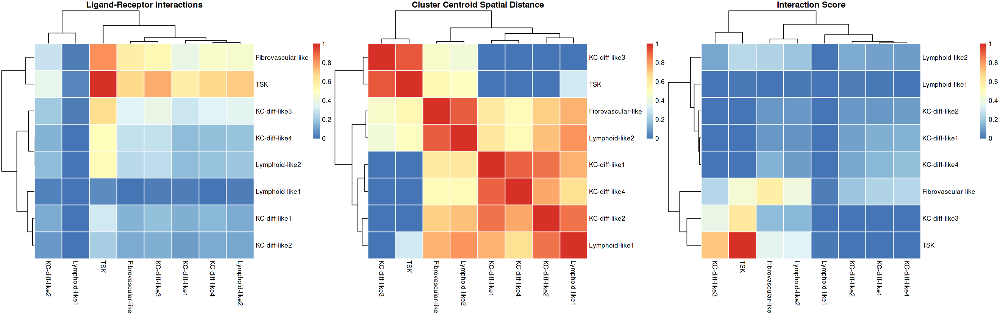

In [17]:
plots <- predictCellInteractions(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                                 cluster.type = "Cluster", graph = my_graph, distance.threshold = 0.75)
options(repr.plot.width = 22, repr.plot.height = 7)
gridExtra::grid.arrange(grobs = plots, ncol = 3)

Fig. 1: A - Ligand-receptor interactions, the spatial distance between the cluster centroids, and the integration of the two aspects into a single score that allows inferring which cells are more likely to interact within a tissue.

**TSK cluster interacts more strongly with the Fibrovascular-like niche, differentiating keratinocytes subsets (KC-diff-3 and -4) niches as well as a lymphoid-like niche (Lymphoid-like2).**

**This analysis also confirmed the interactions between TSK and the Fibrovascular-like niche while reducing the communication scores for cell types further apart in the tissue, showing that spatial location is an important aspect to consider in cell communication.**


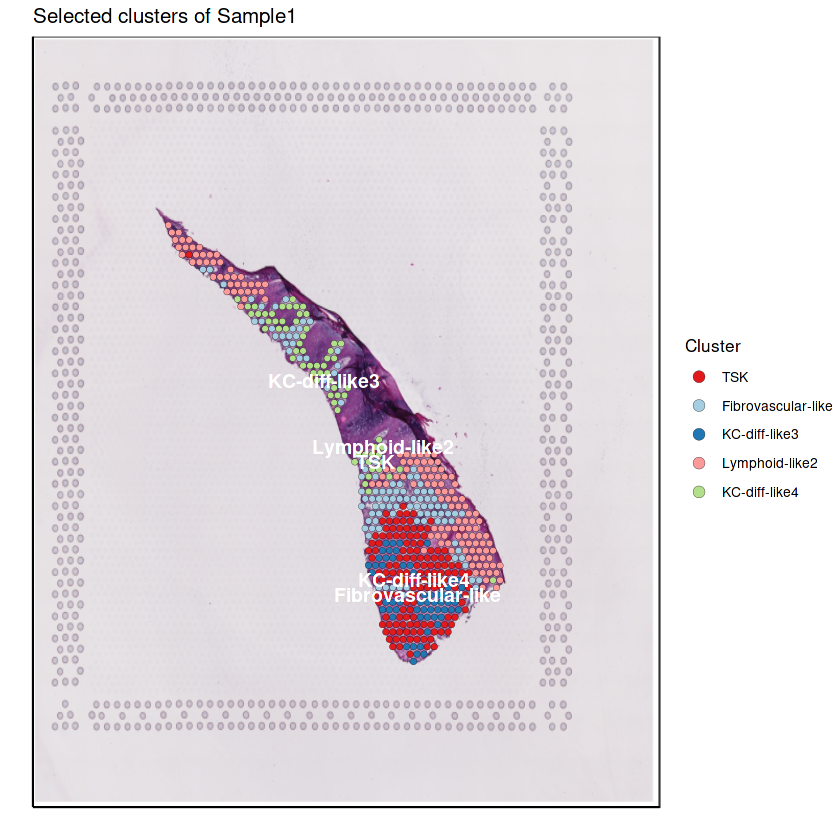

In [18]:
options(repr.plot.width = 7, repr.plot.height = 7)
plotSelectedClusters(cellrouter, assay.type = "ST", sample.name = "Sample1",
                     cluster.column = "celltype", colors.column = "celltype_color",
                     selected_clusters = list(c("TSK", "Fibrovascular-like", "KC-diff-like3", "Lymphoid-like2", "KC-diff-like4")),
                     point.size = 1.5, title = NULL, annotate_centroids = TRUE)

Fig. 1: Clusters with more interactions with TSK overlaid on the image.

## 13. Comparison with the original publication

We selected ligand-receptor pairs identified by CellComm **based on the subset of ligands identified by the original publication** [1], to make the analysis more comparable with the original publication. Specifically, we inferred ligand-receptor pairs between co-localized tumor-TME or TME-tumor interactions.

In [19]:
x <- tmp[which(tmp$ligand %in% c("CCL2", "CCL5", "CTGF", "CXCL10", "CXCL16", "MMP9", "PGF", "TGFB1", "TIMP1", "TNC", "VEGFA")), ]

,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean,celltypes,split,pvalue,population,gene,pvalue2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>,<fct>,<dbl>
TSK_Fibrovascular-like.TNC_SDC1_TSK_Fibrovascular-like,TSK,Fibrovascular-like,TNC_SDC1,TNC,SDC1,1.6539493,1.4289189,1.541434,TSK_Fibrovascular-like,TNC_SDC1_TSK_Fibrovascular-like,0.000999001,TSK_Fibrovascular-like,TNC_SDC1,3.000434
TSK_Fibrovascular-like.TNC_ITGB1_TSK_Fibrovascular-like,TSK,Fibrovascular-like,TNC_ITGB1,TNC,ITGB1,1.6539493,0.8592202,1.256585,TSK_Fibrovascular-like,TNC_ITGB1_TSK_Fibrovascular-like,0.000999001,TSK_Fibrovascular-like,TNC_ITGB1,3.000434
TSK_Fibrovascular-like.TNC_ITGAV_TSK_Fibrovascular-like,TSK,Fibrovascular-like,TNC_ITGAV,TNC,ITGAV,1.6539493,0.5039510,1.078950,TSK_Fibrovascular-like,TNC_ITGAV_TSK_Fibrovascular-like,0.000999001,TSK_Fibrovascular-like,TNC_ITGAV,3.000434
TSK_Fibrovascular-like.MMP9_CD44_TSK_Fibrovascular-like,TSK,Fibrovascular-like,MMP9_CD44,MMP9,CD44,0.2709319,1.8477242,1.059328,TSK_Fibrovascular-like,MMP9_CD44_TSK_Fibrovascular-like,0.000999001,TSK_Fibrovascular-like,MMP9_CD44,3.000434
TSK_Fibrovascular-like.TNC_ITGA5_TSK_Fibrovascular-like,TSK,Fibrovascular-like,TNC_ITGA5,TNC,ITGA5,1.6539493,0.3984875,1.026218,TSK_Fibrovascular-like,TNC_ITGA5_TSK_Fibrovascular-like,0.000999001,TSK_Fibrovascular-like,TNC_ITGA5,3.000434
TSK_Fibrovascular-like.TNC_EGFR_TSK_Fibrovascular-like,TSK,Fibrovascular-like,TNC_EGFR,TNC,EGFR,1.6539493,0.2827088,0.968329,TSK_Fibrovascular-like,TNC_EGFR_TSK_Fibrovascular-like,0.000999001,TSK_Fibrovascular-like,TNC_EGFR,3.000434


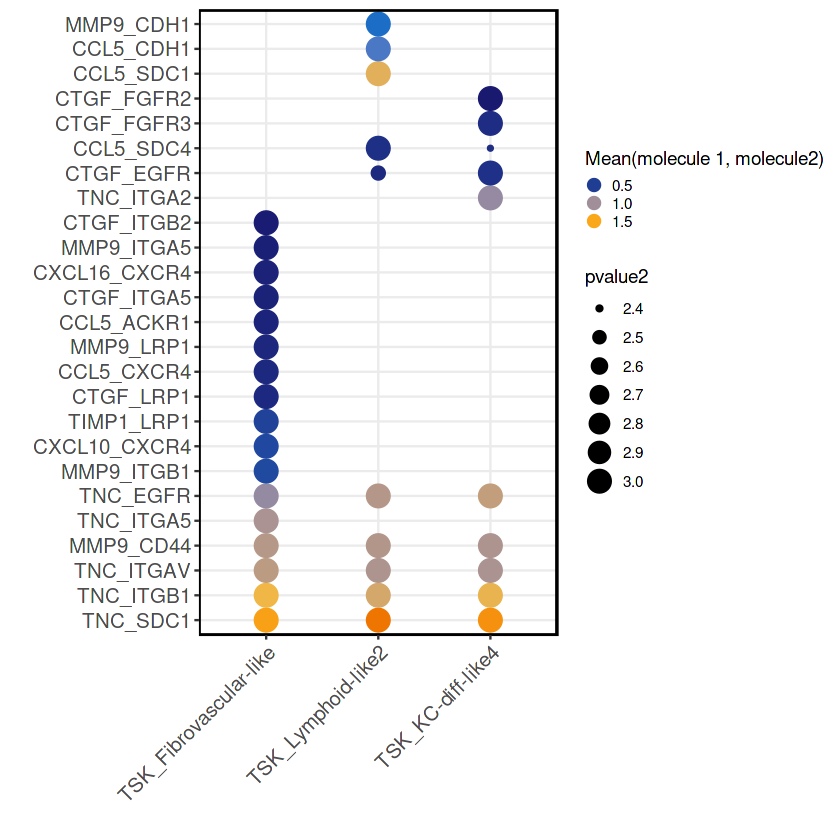

In [20]:
# Tumor -> Stroma
tumor <- c("TSK_Fibrovascular-like", 'TSK_Lymphoid-like2', "TSK_KC-diff-like4")
gene.pairs <- plotPairDotplot(x, interactionList = tumor, num.pairs = 50)
head(gene.pairs$markers)
print(gene.pairs$plot)

Fig. 1: Ligand-receptor interactions detected in cluster pairs (tumor to stroma).

,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean,celltypes,split,pvalue,population,gene,pvalue2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>,<fct>,<dbl>
Fibrovascular-like_TSK.TNC_SDC1_Fibrovascular-like_TSK,Fibrovascular-like,TSK,TNC_SDC1,TNC,SDC1,1.1912236,2.2549560,1.7230898,Fibrovascular-like_TSK,TNC_SDC1_Fibrovascular-like_TSK,0.000999001,Fibrovascular-like_TSK,TNC_SDC1,3.000434
Fibrovascular-like_TSK.TNC_ITGB1_Fibrovascular-like_TSK,Fibrovascular-like,TSK,TNC_ITGB1,TNC,ITGB1,1.1912236,1.5324481,1.3618358,Fibrovascular-like_TSK,TNC_ITGB1_Fibrovascular-like_TSK,0.000999001,Fibrovascular-like_TSK,TNC_ITGB1,3.000434
Fibrovascular-like_TSK.CCL5_SDC1_Fibrovascular-like_TSK,Fibrovascular-like,TSK,CCL5_SDC1,CCL5,SDC1,0.4548011,2.2549560,1.3548785,Fibrovascular-like_TSK,CCL5_SDC1_Fibrovascular-like_TSK,0.000999001,Fibrovascular-like_TSK,CCL5_SDC1,3.000434
Fibrovascular-like_TSK.MMP9_CD44_Fibrovascular-like_TSK,Fibrovascular-like,TSK,MMP9_CD44,MMP9,CD44,0.3963604,2.1191225,1.2577414,Fibrovascular-like_TSK,MMP9_CD44_Fibrovascular-like_TSK,0.000999001,Fibrovascular-like_TSK,MMP9_CD44,3.000434
Fibrovascular-like_TSK.TNC_ITGAV_Fibrovascular-like_TSK,Fibrovascular-like,TSK,TNC_ITGAV,TNC,ITGAV,1.1912236,0.8223144,1.0067690,Fibrovascular-like_TSK,TNC_ITGAV_Fibrovascular-like_TSK,0.000999001,Fibrovascular-like_TSK,TNC_ITGAV,3.000434
Fibrovascular-like_TSK.MMP9_ITGB1_Fibrovascular-like_TSK,Fibrovascular-like,TSK,MMP9_ITGB1,MMP9,ITGB1,0.3963604,1.5324481,0.9644042,Fibrovascular-like_TSK,MMP9_ITGB1_Fibrovascular-like_TSK,0.000999001,Fibrovascular-like_TSK,MMP9_ITGB1,3.000434


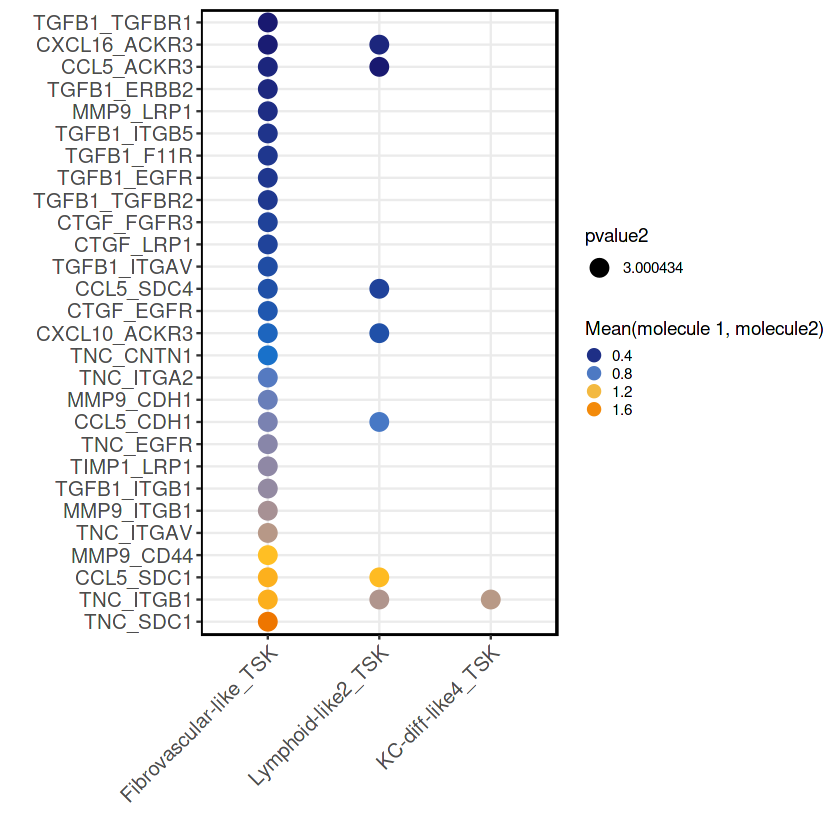

In [21]:
# Stroma -> Tumor
TME <- c("Fibrovascular-like_TSK", 'Lymphoid-like2_TSK', "KC-diff-like4_TSK")
gene.pairs <- plotPairDotplot(x, interactionList = TME, num.pairs = 50)
head(gene.pairs$markers)
print(gene.pairs$plot)

Fig. 1: Ligand-receptor interactions detected in cluster pairs (stroma to tumor).

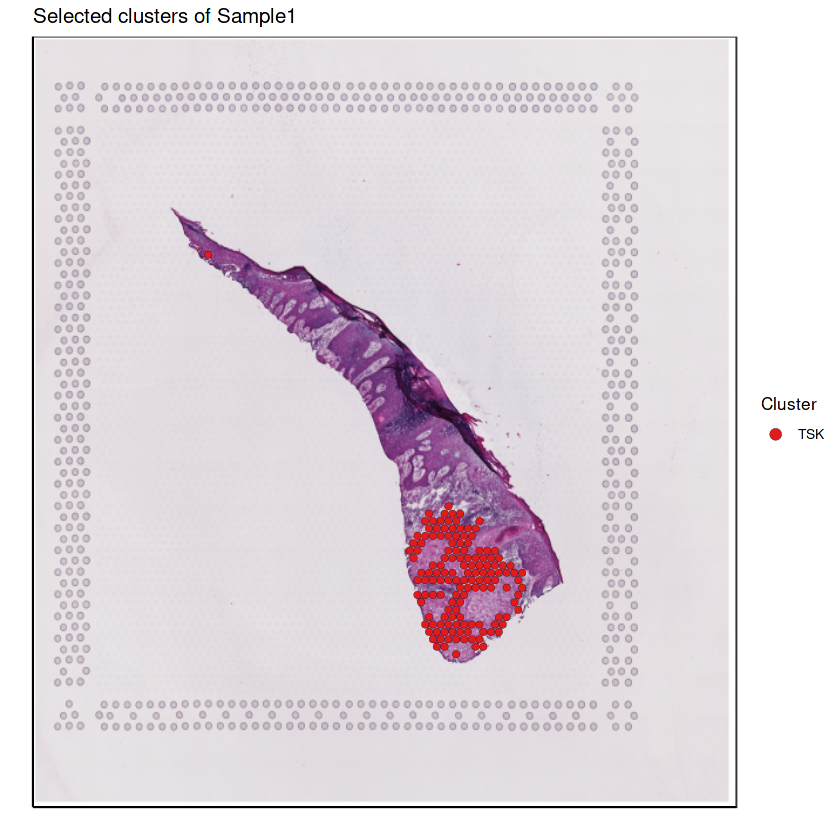

In [22]:
plotSelectedClusters(cellrouter, assay.type = "ST", sample.name = "Sample1",
                     cluster.column = "celltype", colors.column = "celltype_color",
                     selected_clusters = list(c("TSK")), title = NULL, annotate_centroids = FALSE)

Fig. 1: TSK cluster in UMAP space.

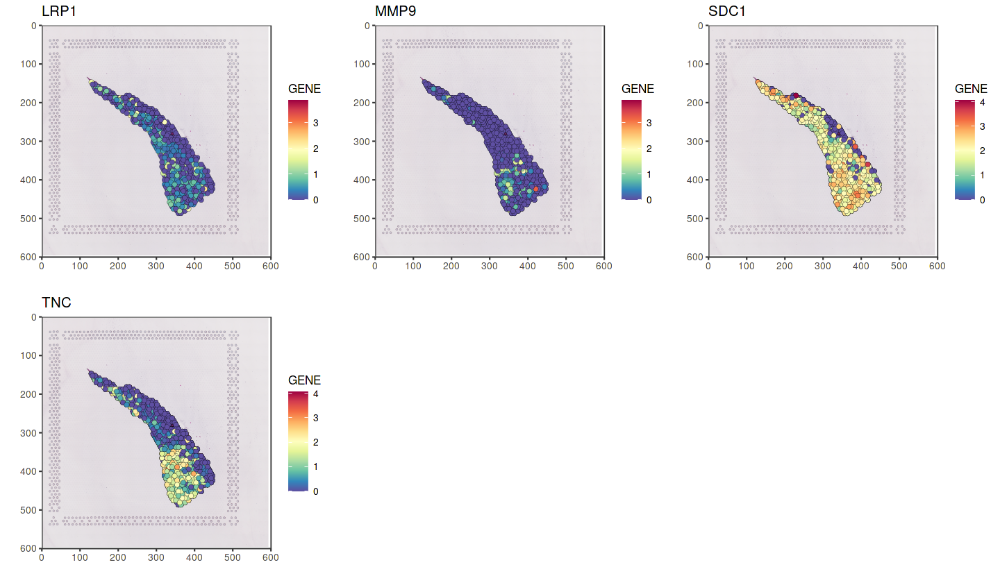

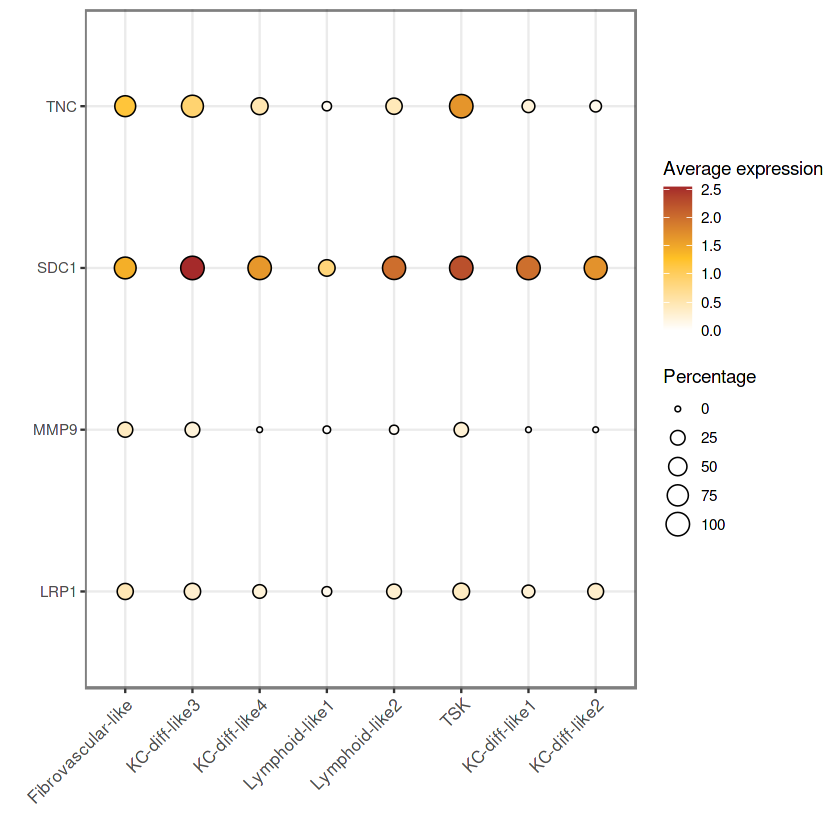

In [23]:
options(repr.plot.width = 12, repr.plot.height = 7)
plots <- plotSpatialExpression(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                               point.size = 1.7, genes = c("LRP1", "MMP9", "SDC1", "TNC"))
gridExtra::grid.arrange(grobs = plots, ncol = 3)

options(repr.plot.width = 7, repr.plot.height = 7)
dotplot(object = cellrouter, assay.type = "ST", 
        genes.use = c("LRP1", "MMP9", "SDC1", "TNC"), column = 'celltype', thr = 0.5)

Fig. 1: Expression of *LRP1*, *MMP9*, *SDC1*, and *TNC* overlaid on the image.

Fig. 2: Expression and proportion of detection of *LRP1*, *MMP9*, *SDC1*, and *TNC* in selected clusters.

In [24]:
save.image(file = "my_step_02.RData")

# **# CellComm in *subcluster-subcluster* communication**

We used CellComm to subcluster spatially-resolved transcriptional clusters based on their spatial localization on the tissue, and performed a focused, spatially-resolved, high-resolution analysis of intercellular communication between TSKs, fibrovascular-like and lymphoid-like niche.

In [25]:
cellrouter <- findSubclusters(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                              cluster.column = "celltype", subcluster.column = "Subpopulation", 
                              method = "mclust")

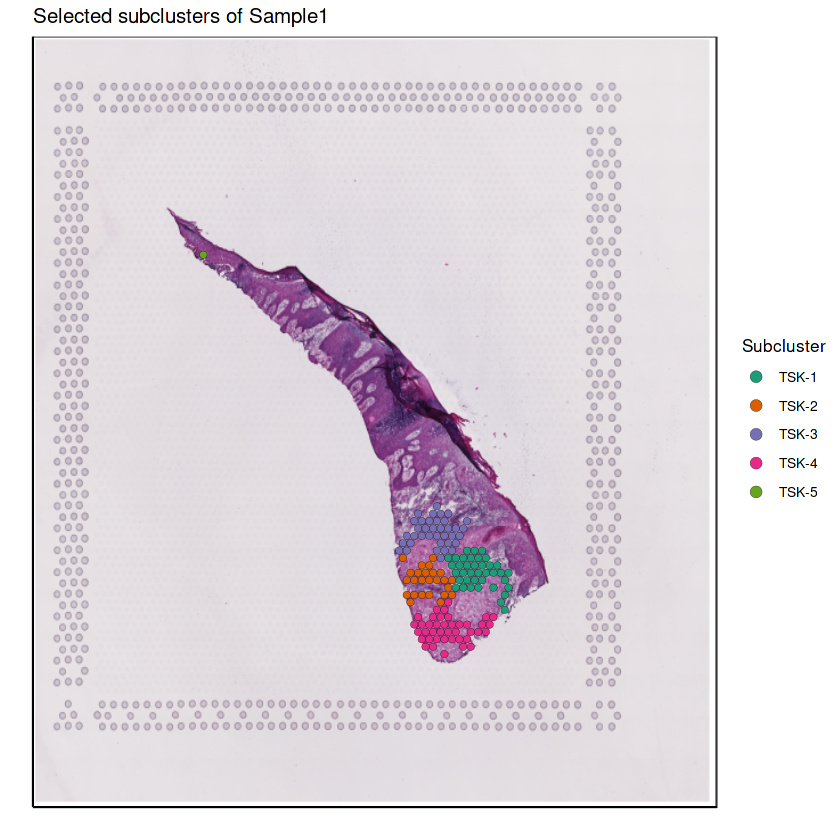

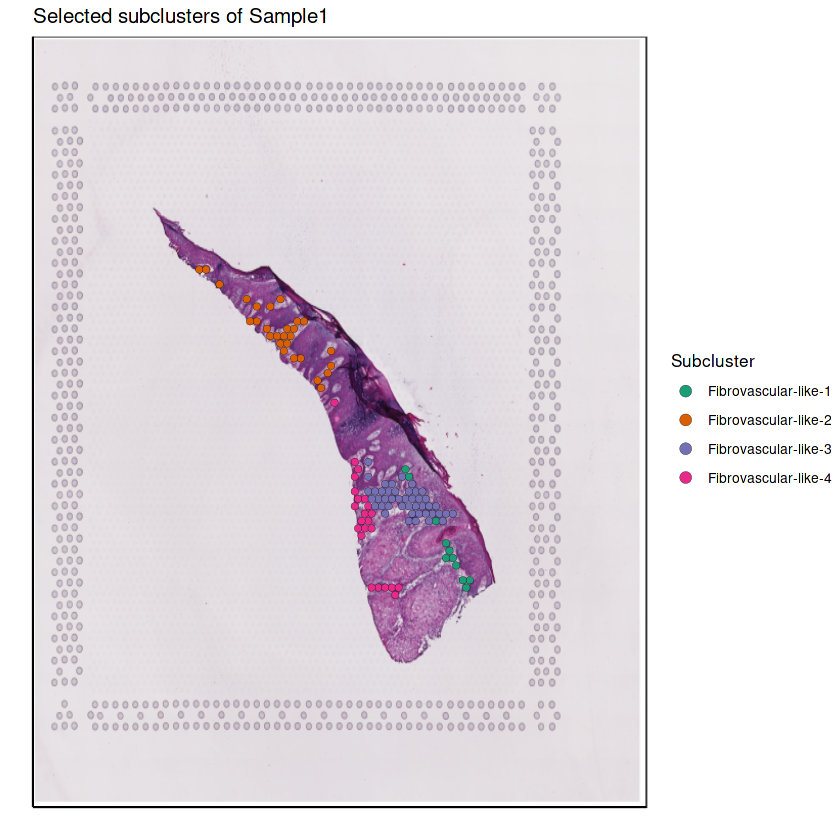

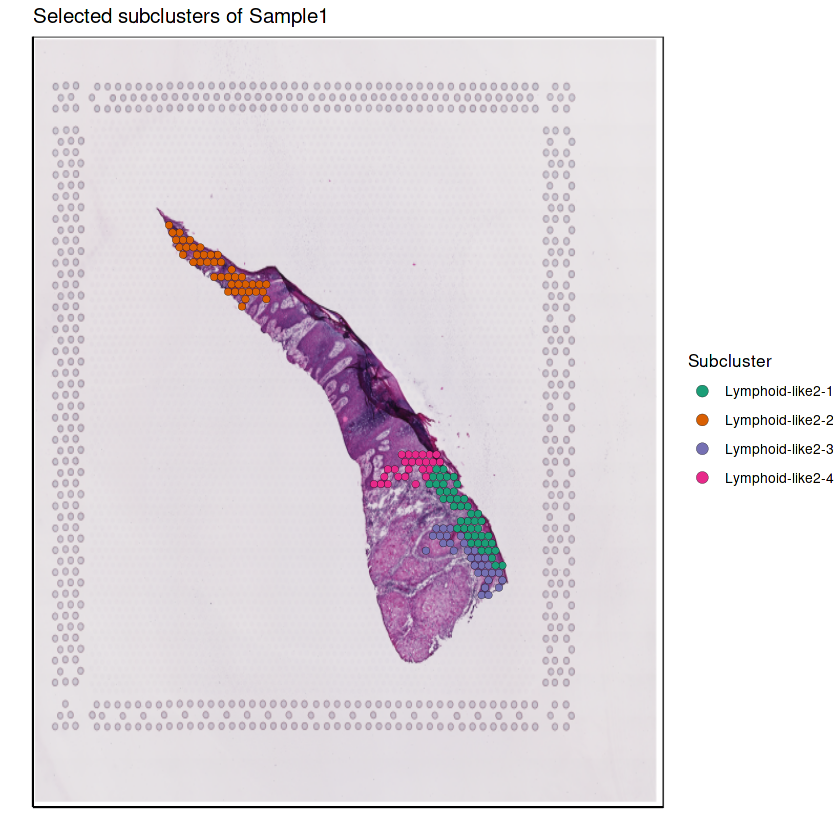

In [26]:
# !
plotSpatialSubclusters(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                       cluster.column = "celltype", subcluster.column = "Subpopulation",
                       selected_clusters = list(c("TSK")),
                       title = NULL, annotate_centroids = FALSE)

plotSpatialSubclusters(cellrouter, assay.type = "ST", sample.name = "Sample1",
                       cluster.column = "celltype", subcluster.column = "Subpopulation",
                       selected_clusters = list(c("Fibrovascular-like")),
                       title = NULL, annotate_centroids = FALSE)

plotSpatialSubclusters(cellrouter, assay.type = "ST", sample.name = "Sample1",
                       cluster.column = "celltype", subcluster.column = "Subpopulation",
                       selected_clusters = list(c("Lymphoid-like2")),
                       title = NULL, annotate_centroids = FALSE)

Fig. 1: Subclusters of the TSK cluster overlaid on the image.

Fig. 2: Subclusters of the Fibrovascular-like cluster overlaid on the image.

Fig. 3: Subclusters of the Lymphoid-like2 cluster overlaid on the image.

## 14. Calculate the mean expression of ligands and receptors per subcluster

Here we accessed a list of ligand-receptor interactions published by Robin Browaeys and collaborators in 2020 (NicheNet: modeling intercellular communication by linking ligands to target genes. Nat Methods 17, 159–162 (2020)) and averaged the expression of each ligand/receptor as well as the mean mean expression of these in each transcriptional subclusters of the spots using the *computeValueSubclusters* and *calculateObservedMean* functions.

Used parameters the *computeValueSubclusters* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- genelist = character, defining the genes to use in the analysis.
- column = "celltype", defining the column with the groups in metadata.
- fun = "mean", statistical function to summary the gene expression data.
- clusters = character, defining the selected clusters.

Used parameters the *population.pairing* function:
- mean.expr = mean.expr.sub, object defined/calculated by the *computeValueSubclusters* function. 
- pairs = pairs, object with ligands/receptors pairs.
- ligands = ligands, defining the list of genes annotated as ligands.
- receptors = receptors, defining the list of genes annotated as receptors.
- threshold = 0.25, threshold to select the genes in the population according to their mean expression.

Used parameters the *calculateObservedMean* function:
- mean.expr = mean.expr.sub, object defined/calculated by the *computeValueSubclusters* function.
- interactions = interactions, object defined/calculated by the *population.pairing* function.

Used parameters the *findSignatures* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- column = "celltype", defining the column with the groups in metadata.
- pos.only = TRUE, defining to get only the up-regulated genes.
- fc.threshold = 0.2, defining the fold change threshold.

In [27]:
lr_network = readRDS(url("https://zenodo.org/record/3260758/files/lr_network.rds"))# from NicheNet
head(lr_network)

pairs <- lr_network
pairs$Pair.Name <- paste(pairs$from, pairs$to, sep = "_")

ligands <- unique(lr_network$from)
ligands <- intersect(ligands, rownames(cellrouter@assays$ST@ndata))

receptors <- unique(lr_network$to)
receptors <- intersect(receptors, rownames(cellrouter@assays$ST@ndata))

ligand.receptors <- unique(c(ligands, receptors))

mean.expr.sub <- computeValueSubclusters(cellrouter, assay.type = "ST", 
                                         genelist = ligand.receptors, column = "celltype", fun = "mean", 
                                         clusters = c("TSK", "Fibrovascular-like", "Lymphoid-like2")); gc();

interactions <- population.pairing(mean.expr = mean.expr.sub, pairs, ligands = ligands, receptors = receptors, threshold = 0.25)

interactions <- calculateObservedMean(interactions, mean.expr.sub)
head(interactions)

markers <- findSignatures(cellrouter, assay.type = 'ST', 
                          column = 'Subpopulation', pos.only = TRUE, fc.threshold = 0.2); gc();

from,to,source,database
<chr>,<chr>,<chr>,<chr>
CXCL1,CXCR2,kegg_cytokines,kegg
CXCL2,CXCR2,kegg_cytokines,kegg
CXCL3,CXCR2,kegg_cytokines,kegg
CXCL5,CXCR2,kegg_cytokines,kegg
PPBP,CXCR2,kegg_cytokines,kegg
CXCL6,CXCR2,kegg_cytokines,kegg


[1] "discovering subpopulation-specific gene signatures"
cluster  Lymphoid-like2-1 
cluster  TSK-1 
cluster  TSK-2 
cluster  Fibrovascular-like-3 
cluster  Lymphoid-like2-2 
cluster  Lymphoid-like2-4 
cluster  Fibrovascular-like-2 
cluster  Lymphoid-like2-3 
cluster  TSK-3 
cluster  TSK-4 
cluster  Fibrovascular-like-1 
cluster  Fibrovascular-like-4 
cluster  TSK-5 


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3603105,192.5,17567904,938.3,27449850,1466.0
Vcells,67003640,511.2,297766278,2271.8,465257628,3549.7


,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,Lymphoid-like2-1,Lymphoid-like2-1,COL1A1_ITGB1,COL1A1,ITGB1,0.6871699,0.4182506,0.5527102
2,Lymphoid-like2-1,Lymphoid-like2-1,TNC_ITGB1,TNC,ITGB1,0.2566876,0.4182506,0.3374691
3,Lymphoid-like2-1,Lymphoid-like2-1,AGRN_ITGB1,AGRN,ITGB1,0.3213930,0.4182506,0.3698218
4,Lymphoid-like2-1,Lymphoid-like2-1,ADAM15_ITGB1,ADAM15,ITGB1,0.5177266,0.4182506,0.4679886
5,Lymphoid-like2-1,Lymphoid-like2-1,ADAM9_ITGB1,ADAM9,ITGB1,0.2505551,0.4182506,0.3344028
6,Lymphoid-like2-1,Lymphoid-like2-1,COL18A1_ITGB1,COL18A1,ITGB1,0.2557250,0.4182506,0.3369878


Calculating fold changes... 
[1] "Identify cluster-specific gene signatures"
cluster  Lymphoid-like2-1 
[1] 576
cluster  TSK-1 
[1] 1123
cluster  TSK-2 
[1] 785
cluster  Lymphoid-like1-1 
[1] 1639
cluster  Lymphoid-like1-2 
[1] 1660
cluster  KC-diff-like2-1 
[1] 895
cluster  Lymphoid-like1-3 
[1] 1790
cluster  Lymphoid-like1-4 
[1] 1945
cluster  KC-diff-like3-1 
[1] 789
cluster  Fibrovascular-like-3 
[1] 2174
cluster  Lymphoid-like2-2 
[1] 734
cluster  Lymphoid-like2-4 
[1] 489
cluster  KC-diff-like4-4 
[1] 914
cluster  KC-diff-like3-2 
[1] 935
cluster  Fibrovascular-like-2 
[1] 2355
cluster  KC-diff-like2-2 
[1] 1261
cluster  Lymphoid-like2-3 
[1] 849
cluster  KC-diff-like1-1 
[1] 527
cluster  TSK-3 
[1] 1132
cluster  KC-diff-like3-6 
[1] 455
cluster  KC-diff-like3-3 
[1] 630
cluster  KC-diff-like4-2 
[1] 995
cluster  KC-diff-like1-2 
[1] 394
cluster  KC-diff-like4-3 
[1] 1491
cluster  TSK-4 
[1] 958
cluster  KC-diff-like3-4 
[1] 748
cluster  Fibrovascular-like-1 
[1] 2662
cluster  KC

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3602878,192.5,11243460,600.5,27449850,1466.0
Vcells,67387127,514.2,190570419,1454.0,465257628,3549.7


## 15. Calculate a null distribution of intrasubcluster gene expression means

Next, CellComm shuffles cell state labels to calculate a null distribution of **intrasubcluster gene expression means** and calculate an empirical *p*-value, which is used to filter out ligand-receptor interactions observed by chance. This algorithm predicts potential subcluster-subcluster interaction networks based on ligand-receptor pairings observed more often than expected by chance.

Used parameters the *clusterPermutationSubcluster* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- nPerm = 1000, defining the number of permutations.
- interactions = interactions, object defined/calculated by the *population.pairing* function.
- genelist = character, defining the genes to use in the analysis.
- cluster.label = "celltype", defining the column with the groups in metadata.
- clusters = character, defining the selected clusters.

Used parameters the *calculatePvalue* function:
- p = p, object defined/calculated by the *clusterPermutation* function. 
- nPerm = 1000, defining the number of permutations.
- interactions = interactions, object defined/calculated by the *population.pairing* function.

In [ ]:
genelist <- unique(c(interactions$ligand, interactions$receptor))

p <- clusterPermutationSubcluster(cellrouter, assay.type = "ST", 
                                  genelist = genelist, interactions = interactions, cluster.label = "celltype", nPerm = 1000, 
                                  clusters = c("TSK", "Fibrovascular-like", "Lymphoid-like2"))

interactions.p <- calculatePvalue(p, nPerm = 1000, interactions2 = interactions)

saveRDS(interactions.p, file = paste(bd, '/interactions_subcluster_with_Pvalue.rds', sep=""))

In [29]:
tmp <- interactions.p[which(interactions.p$pvalue < 0.01), ]
head(tmp)

,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean,celltypes,split,pvalue
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
A2M_LRP1_Fibrovascular-like-2_Fibrovascular-like-2,Fibrovascular-like-2,Fibrovascular-like-2,A2M_LRP1,A2M,LRP1,1.251523,0.6130214,0.9322721,Fibrovascular-like-2_Fibrovascular-like-2,A2M_LRP1_Fibrovascular-like-2_Fibrovascular-like-2,0.000999001
A2M_LRP1_Fibrovascular-like-2_Fibrovascular-like-4,Fibrovascular-like-2,Fibrovascular-like-4,A2M_LRP1,A2M,LRP1,1.251523,0.5530047,0.9022638,Fibrovascular-like-2_Fibrovascular-like-4,A2M_LRP1_Fibrovascular-like-2_Fibrovascular-like-4,0.000999001
A2M_LRP1_Fibrovascular-like-2_TSK-4,Fibrovascular-like-2,TSK-4,A2M_LRP1,A2M,LRP1,1.251523,0.4211158,0.8363193,Fibrovascular-like-2_TSK-4,A2M_LRP1_Fibrovascular-like-2_TSK-4,0.000999001
A2M_LRP1_Fibrovascular-like-3_Fibrovascular-like-1,Fibrovascular-like-3,Fibrovascular-like-1,A2M_LRP1,A2M,LRP1,1.328069,0.4435369,0.8858027,Fibrovascular-like-3_Fibrovascular-like-1,A2M_LRP1_Fibrovascular-like-3_Fibrovascular-like-1,0.000999001
A2M_LRP1_Fibrovascular-like-3_Fibrovascular-like-2,Fibrovascular-like-3,Fibrovascular-like-2,A2M_LRP1,A2M,LRP1,1.328069,0.6130214,0.9705450,Fibrovascular-like-3_Fibrovascular-like-2,A2M_LRP1_Fibrovascular-like-3_Fibrovascular-like-2,0.000999001
A2M_LRP1_Fibrovascular-like-3_Fibrovascular-like-3,Fibrovascular-like-3,Fibrovascular-like-3,A2M_LRP1,A2M,LRP1,1.328069,0.3448328,0.8364507,Fibrovascular-like-3_Fibrovascular-like-3,A2M_LRP1_Fibrovascular-like-3_Fibrovascular-like-3,0.000999001


## 16. Calculate a network based on the number of interactions (ligand/receptors), subcluster centroids and distances between these subclusters

Used parameters the *cellnetwork3* function:
- threshold = 5, defining the number of elements in the pair for it to be selected.

Used parameters the *calculateCentroids* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- sample.name = "Sample1", defining the name of the sample.
- cluster.column = "Subpopulation", defining the column with the groups in metadata.
- cluster.type = "Subcluster", defining the column where the clusters are indicated. It could be either 'Cluster' or 'Subcluster'.

Used parameters the *calculateDistanceMatrix* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- sample.name = "Sample1", defining the name of the sample.
- cluster.type = "Subcluster", defining the column where the clusters are indicated. It could be either 'Cluster' or 'Subcluster'.
- spot_distance = 100, defining the distance between the center of the spots.
- normalize = FALSE, normalize the distances dividing by the total size of the tissue.

In [30]:
my_matrix <- interactionmatrix(tmp)
head(matrix)

my_graph <- cellnetwork3(tmp, threshold = 5)

cellrouter <- calculateCentroids(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                                 cluster.column = "Subpopulation", cluster.type = "Subcluster")

cellrouter <- calculateDistanceMatrix(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                                      cluster.type = "Subcluster", spot_distance = 100, normalize = FALSE)

                                                                           
1 function (data = NA, nrow = 1, ncol = 1, byrow = FALSE, dimnames = NULL) 
2 {                                                                        
3     if (is.object(data) || !is.atomic(data))                             
4         data <- as.vector(data)                                          
5     .Internal(matrix(data, nrow, ncol, byrow, dimnames, missing(nrow),   
6         missing(ncol)))                                                  

[1] "split"
[1] "rbind.fill"
[1] "rbind.done"


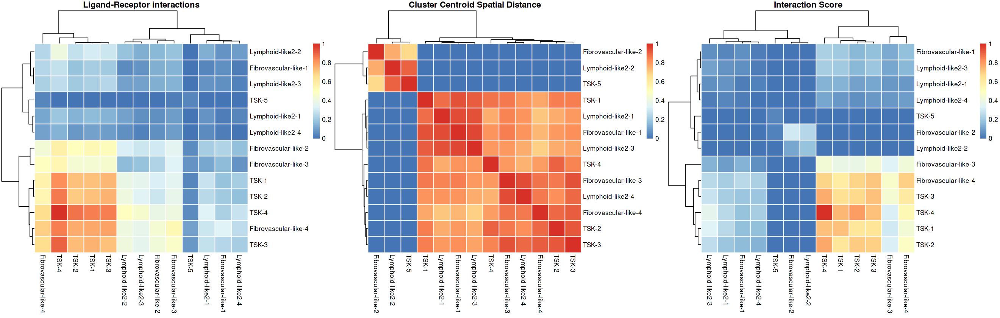

In [31]:
plots <- predictCellInteractions(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                                 cluster.type = "Subcluster", graph = my_graph, distance.threshold = 0.35) # Cluster: distance.threshold = 0.75
options(repr.plot.width = 22, repr.plot.height = 7)
gridExtra::grid.arrange(grobs = plots, ncol = 3)

Fig. 1: A - Ligand-receptor interactions, the spatial distance between the subcluster centroids, and the integration of the two aspects into a single score that allows inferring which cells are more likely to interact within a tissue.

**We found that TSK interacts more strongly with co-localized niches, such as the fibrovascular and lymphoid niche subsets, than the spatially distant Fibrovascular-like-2 or Lymphoid-like-2 subsets.**

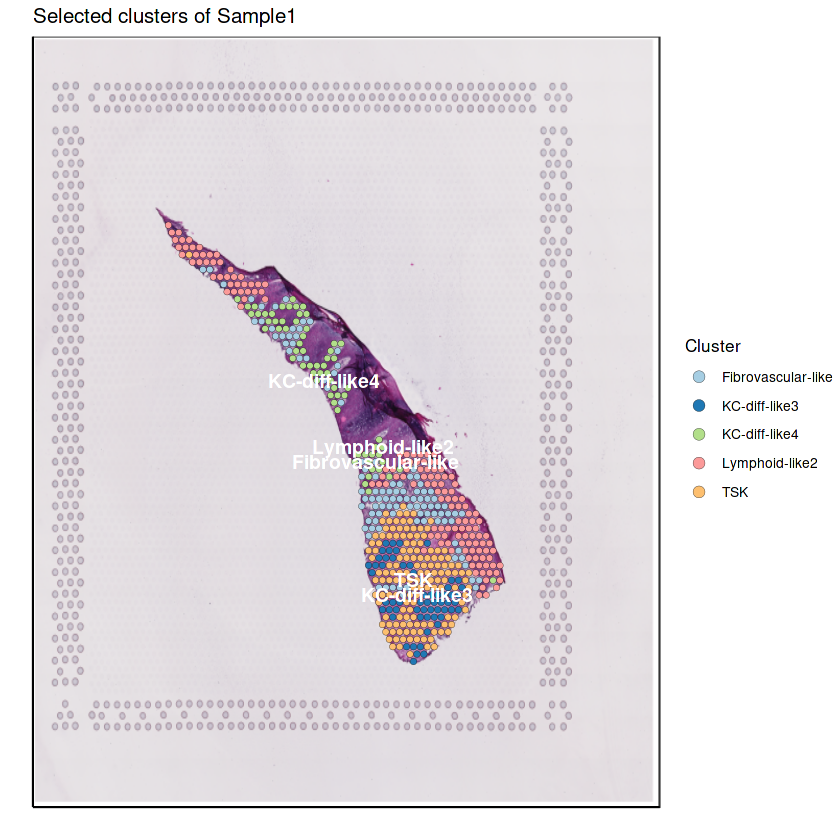

In [32]:
options(repr.plot.width = 7, repr.plot.height = 7)
plotSelectedClusters(cellrouter, assay.type = "ST", sample.name = "Sample1",
                     cluster.column = "celltype", colors.column = "celltype_color",
                     selected_clusters = list(c("Fibrovascular-like", "KC-diff-like3", "KC-diff-like4", "Lymphoid-like2", "TSK")),
                     point.size = 1.5, title=NULL, annotate_centroids=TRUE)

x <- tmp[which(tmp$ligand %in% c("CCL2", "CCL5", "CTGF", "CXCL10", "CXCL16", "MMP9", "PGF", "TGFB1", "TIMP1", "TNC", "VEGFA")), ]

Fig. 1: Subclusters with more interactions with TSK overlaid on the image.

## 17. Comparison with the original publication

We selected ligand-receptor pairs identified by CellComm **based on the subset of ligands identified by the original publication** [1], to make the analysis more comparable with the original publication. Specifically, we inferred ligand-receptor pairs between co-localized tumor-TME or TME-tumor interactions.

,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean,celltypes,split,pvalue,population,gene,pvalue2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>,<fct>,<dbl>
TSK-1_Fibrovascular-like-4.TNC_ITGB1_TSK-1_Fibrovascular-like-4,TSK-1,Fibrovascular-like-4,TNC_ITGB1,TNC,ITGB1,1.574534,1.2577829,1.4161586,TSK-1_Fibrovascular-like-4,TNC_ITGB1_TSK-1_Fibrovascular-like-4,0.000999001,TSK-1_Fibrovascular-like-4,TNC_ITGB1,3.000434
TSK-1_Fibrovascular-like-4.TNC_ITGA5_TSK-1_Fibrovascular-like-4,TSK-1,Fibrovascular-like-4,TNC_ITGA5,TNC,ITGA5,1.574534,0.6429877,1.1087610,TSK-1_Fibrovascular-like-4,TNC_ITGA5_TSK-1_Fibrovascular-like-4,0.000999001,TSK-1_Fibrovascular-like-4,TNC_ITGA5,3.000434
TSK-1_Fibrovascular-like-4.TNC_ITGAV_TSK-1_Fibrovascular-like-4,TSK-1,Fibrovascular-like-4,TNC_ITGAV,TNC,ITGAV,1.574534,0.6262494,1.1003919,TSK-1_Fibrovascular-like-4,TNC_ITGAV_TSK-1_Fibrovascular-like-4,0.001998002,TSK-1_Fibrovascular-like-4,TNC_ITGAV,2.699404
TSK-1_Fibrovascular-like-4.TNC_EGFR_TSK-1_Fibrovascular-like-4,TSK-1,Fibrovascular-like-4,TNC_EGFR,TNC,EGFR,1.574534,0.3917741,0.9831543,TSK-1_Fibrovascular-like-4,TNC_EGFR_TSK-1_Fibrovascular-like-4,0.006993007,TSK-1_Fibrovascular-like-4,TNC_EGFR,2.155336
TSK-2_Fibrovascular-like-4.TNC_ITGB1_TSK-2_Fibrovascular-like-4,TSK-2,Fibrovascular-like-4,TNC_ITGB1,TNC,ITGB1,1.752345,1.2577829,1.5050638,TSK-2_Fibrovascular-like-4,TNC_ITGB1_TSK-2_Fibrovascular-like-4,0.000999001,TSK-2_Fibrovascular-like-4,TNC_ITGB1,3.000434
TSK-2_Fibrovascular-like-4.TNC_ITGA5_TSK-2_Fibrovascular-like-4,TSK-2,Fibrovascular-like-4,TNC_ITGA5,TNC,ITGA5,1.752345,0.6429877,1.1976662,TSK-2_Fibrovascular-like-4,TNC_ITGA5_TSK-2_Fibrovascular-like-4,0.000999001,TSK-2_Fibrovascular-like-4,TNC_ITGA5,3.000434


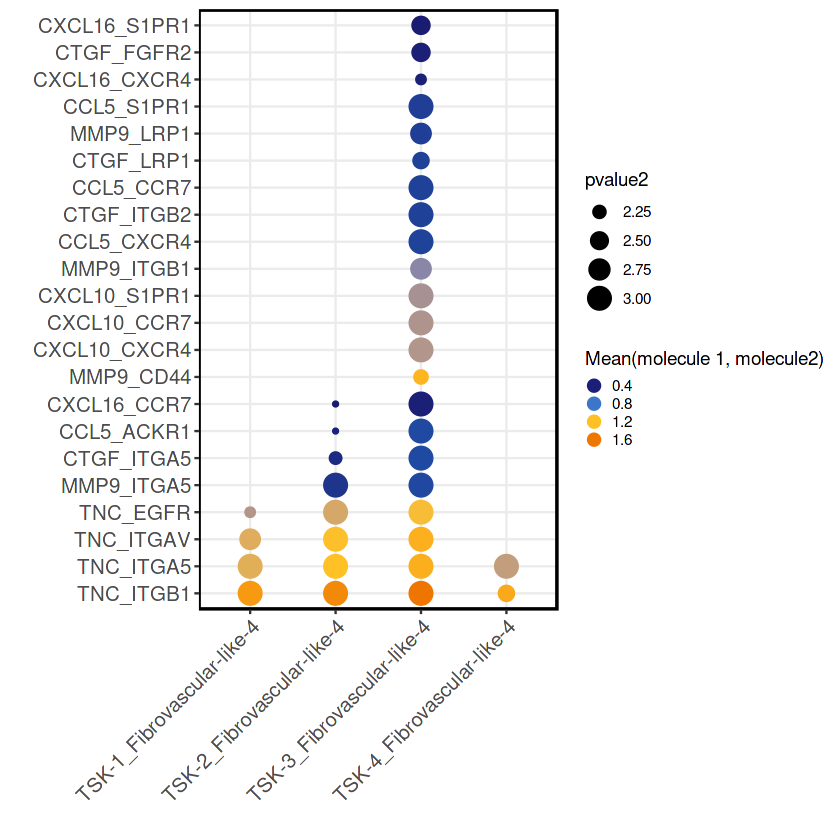

In [33]:
# Tumor -> Stroma
tumor <- c("TSK-1_Fibrovascular-like-4", "TSK-2_Fibrovascular-like-4", "TSK-3_Fibrovascular-like-4", "TSK-4_Fibrovascular-like-4")
gene.pairs_01 <- plotPairDotplot(x, interactionList = tumor, num.pairs = 50)
head(gene.pairs_01$markers)
plot(gene.pairs_01$plot)

Fig. 1: Ligand-receptor interactions detected in subcluster pairs (tumor to stroma).

,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean,celltypes,split,pvalue,population,gene,pvalue2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>,<fct>,<dbl>
Fibrovascular-like-4_TSK-1.TNC_SDC1_Fibrovascular-like-4_TSK-1,Fibrovascular-like-4,TSK-1,TNC_SDC1,TNC,SDC1,1.3958322,2.1485023,1.772167,Fibrovascular-like-4_TSK-1,TNC_SDC1_Fibrovascular-like-4_TSK-1,0.004995005,Fibrovascular-like-4_TSK-1,TNC_SDC1,2.301464
Fibrovascular-like-4_TSK-1.TNC_ITGB1_Fibrovascular-like-4_TSK-1,Fibrovascular-like-4,TSK-1,TNC_ITGB1,TNC,ITGB1,1.3958322,1.4964854,1.446159,Fibrovascular-like-4_TSK-1,TNC_ITGB1_Fibrovascular-like-4_TSK-1,0.000999001,Fibrovascular-like-4_TSK-1,TNC_ITGB1,3.000434
Fibrovascular-like-4_TSK-1.CCL5_SDC1_Fibrovascular-like-4_TSK-1,Fibrovascular-like-4,TSK-1,CCL5_SDC1,CCL5,SDC1,0.5407590,2.1485023,1.344631,Fibrovascular-like-4_TSK-1,CCL5_SDC1_Fibrovascular-like-4_TSK-1,0.007992008,Fibrovascular-like-4_TSK-1,CCL5_SDC1,2.097344
Fibrovascular-like-4_TSK-1.MMP9_CD44_Fibrovascular-like-4_TSK-1,Fibrovascular-like-4,TSK-1,MMP9_CD44,MMP9,CD44,0.5341961,2.0610894,1.297643,Fibrovascular-like-4_TSK-1,MMP9_CD44_Fibrovascular-like-4_TSK-1,0.003996004,Fibrovascular-like-4_TSK-1,MMP9_CD44,2.398374
Fibrovascular-like-4_TSK-1.TNC_ITGAV_Fibrovascular-like-4_TSK-1,Fibrovascular-like-4,TSK-1,TNC_ITGAV,TNC,ITGAV,1.3958322,0.7947594,1.095296,Fibrovascular-like-4_TSK-1,TNC_ITGAV_Fibrovascular-like-4_TSK-1,0.002997003,Fibrovascular-like-4_TSK-1,TNC_ITGAV,2.523313
Fibrovascular-like-4_TSK-1.MMP9_ITGB1_Fibrovascular-like-4_TSK-1,Fibrovascular-like-4,TSK-1,MMP9_ITGB1,MMP9,ITGB1,0.5341961,1.4964854,1.015341,Fibrovascular-like-4_TSK-1,MMP9_ITGB1_Fibrovascular-like-4_TSK-1,0.000999001,Fibrovascular-like-4_TSK-1,MMP9_ITGB1,3.000434


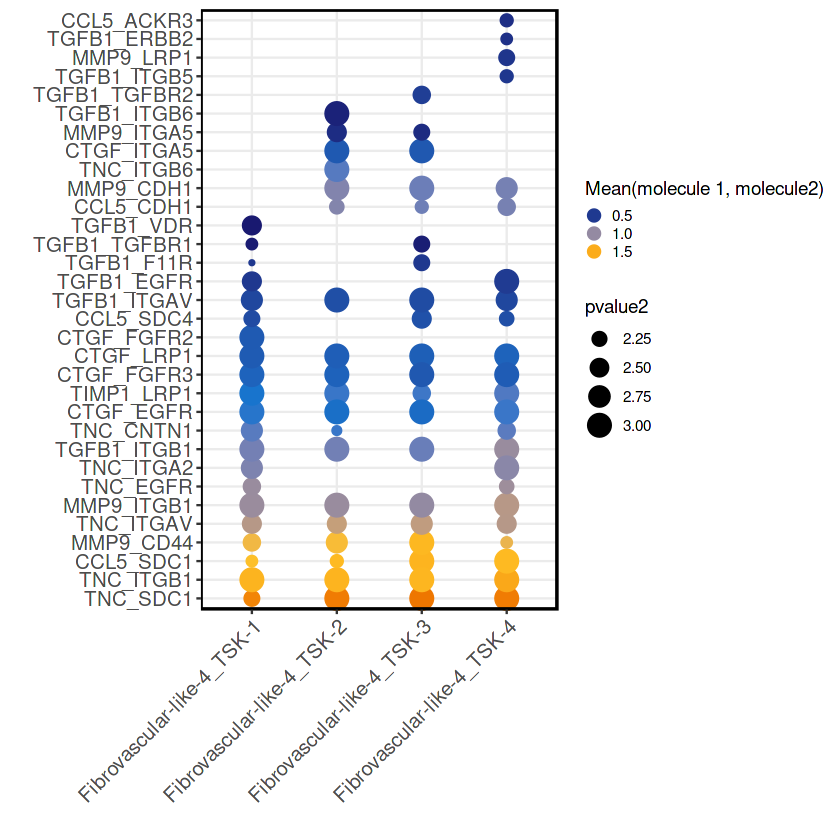

In [34]:
# Stroma -> Tumor
TME <- c("Fibrovascular-like-4_TSK-1", "Fibrovascular-like-4_TSK-2", "Fibrovascular-like-4_TSK-3", "Fibrovascular-like-4_TSK-4")
gene.pairs_02 <- plotPairDotplot(x, interactionList = TME, num.pairs = 50)
head(gene.pairs_02$markers)
plot(gene.pairs_02$plot)

Fig. 1: Ligand-receptor interactions detected in subcluster pairs (stroma to tumor).

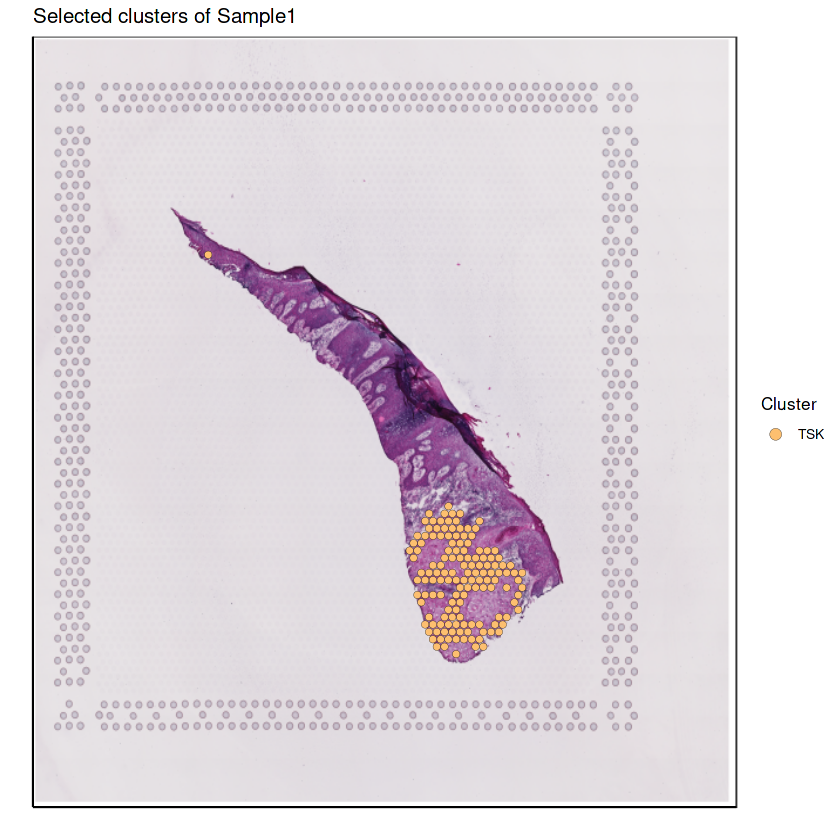

In [35]:
plotSelectedClusters(cellrouter, assay.type = "ST", sample.name = "Sample1",
                     cluster.column = "celltype", colors.column = "celltype_color",
                     selected_clusters = list(c("TSK")), title = NULL, annotate_centroids = FALSE)

Fig. 1: TSK cluster in UMAP space.

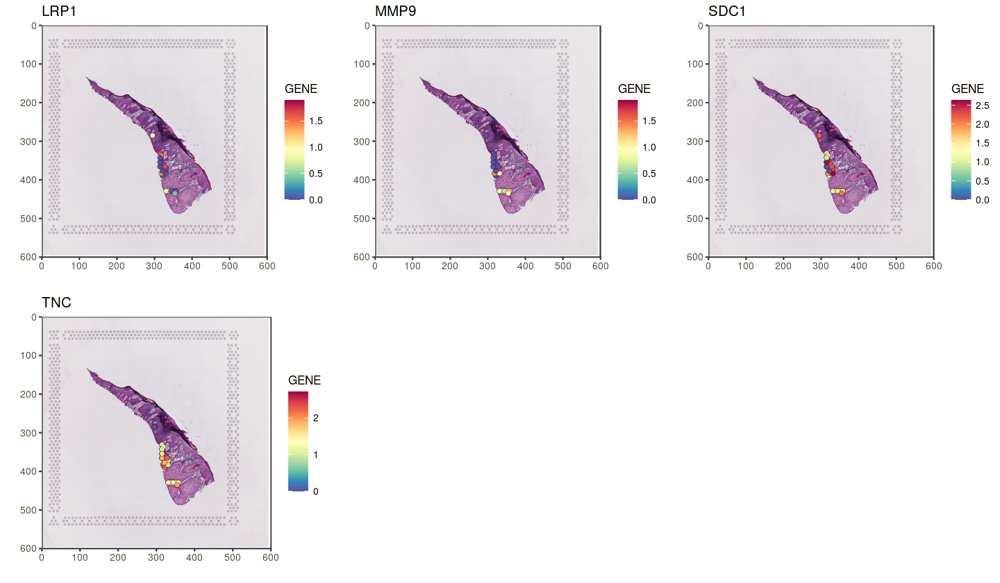

In [36]:
options(repr.plot.width = 12, repr.plot.height = 7)
plots <- plotSpatialExpression(cellrouter, assay.type = "ST", sample.name = "Sample1", 
                               point.size = 1.7, genes = c("LRP1", "MMP9", "SDC1", "TNC"), 
                               cluster.column = "Subpopulation", selected_clusters = c("Fibrovascular-like-4", "TSK-1"))
gridExtra::grid.arrange(grobs = plots, ncol = 3)

Fig. 1: Expression of *LRP1*, *MMP9*, *SDC1*, and *TNC* overlaid on the image.

## 18. Predict a gene regulatory network (GRN) and create/define a protein-protein interaction network (PPI) for intracellular signaling.

Then we identified transcription factors and transcription regulators based on gene ontology annotations and defined two igraph objects (networks) containing the GRN and the PPI network using the *buildGRN* and *createPPI* functions. The PPI network used data from the *iRefIndex* database.

Used parameters the *buildGRN* function:
- assay.type = "ST", defining spatial transcriptomics analysis.
- species = "Hs", defining the species: *Hs* for *Homo Sapiens* or *Mm* for *Mus Musculus*.
- genes.use = character, defining the genes to to include in the gene regulatory network. 
- blocksize = numeric, defining the size of the blocks in which genes will be scaled.
- zscore = 4, defining the threshold to identify putative regulatory interactions.
- filename = character, filename where the GRN data will be saved.

Used parameters the *createPPI* function:
- filename = character, protein interaction data.
- expr = cellrouter@assays$ST@ndata, gene expression in each cell.

In [37]:
filename <- paste(bd, "/GRN_P4R1.R", sep = "")

grn.data <- buildGRN(cellrouter, assay.type = "ST", 
                     species = "Hs", genes.use = rownames(cellrouter@assays$ST@ndata), blocksize = nrow(cellrouter@assays$ST@ndata), zscore = 4, 
                     filename = filename)

filename <- "9606.mitab.05-29-2019_zcat.txt"

inetwork <- createPPI(filename = filename, expr = cellrouter@assays$ST@ndata)

filename <- paste(bd, "/9606.mitab.05-29-2019_zcat.R", sep = "")

save(inetwork, file = filename)

Loading gene annotations...


Matching gene symbols and annotations...[1] "mat_zscores"

 11608 11608 
1000  of  11608  processed
2000  of  11608  processed
3000  of  11608  processed
4000  of  11608  processed
5000  of  11608  processed
6000  of  11608  processed
7000  of  11608  processed
8000  of  11608  processed
9000  of  11608  processed
10000  of  11608  processed
11000  of  11608  processed
1943608 54
Protein interaction data loaded!

Warning message in createPPI(filename = filename, expr = cellrouter@assays$ST@ndata):
“NAs introduced by coercion”
Warning message in igraph::graph.data.frame(idmap, directed = FALSE):
“In `d' `NA' elements were replaced with string "NA"”


## 19. Create a weighted PPI network based on cell-type (cluster/subcluster-type) specific correlation coefficients.

Used parameters the *cellnetworksPPI2* function:
- ppi = inetwork$network, defining the network as calculated by the *createPPI* function.

- expr = cellrouter@assays$ST@ndata, defining the gene expression in each cell/spot.

- samples = cellrouter@assays$ST@sampTab, defining the metadata information of the cells/spots.

- column = "Subpopulation", defining the column with the groups in metadata. 

- corThr1 = 0.10, values smaller then corThr1 in the correlation matrix will be replaced by 0. Therefore, there will be no connections between the genes with value 0.

- corThr2 = 0.25, keep gene-gene interactions with correlation higher than the threshold.

- dir.prefix = "", defining the prefix of the directory where the files will be saved.

In [ ]:
#inetwork <- get(load(paste(basedir, "/9606.mitab.05-29-2019_zcat.R", sep = "")))

In [38]:
corTables <- cellnetworksPPI2(ppi = inetwork$network, expr = cellrouter@assays$ST@ndata, 
                              samples = cellrouter@assays$ST@sampTab, column = 'Subpopulation', 
                              corThr1 = 0.10, corThr2 = 0.25, dir.prefix = "")

grn.data <- get(load(paste(bd, '/GRN_P4R1.R', sep=""))) # !

[1] "Lymphoid-like2-1"
[1] -0.8903921  1.0000000
[1] "TSK-1"
[1] -0.9059142  1.0000000
[1] "TSK-2"
[1] -0.9311566  1.0000000
[1] "Lymphoid-like1-1"
[1] -0.910059  1.000000
[1] "Lymphoid-like1-2"
[1] -0.8917018  1.0000000
[1] "KC-diff-like2-1"
[1] -0.9728506  1.0000000
[1] "Lymphoid-like1-3"
[1] -0.856436  1.000000
[1] "Lymphoid-like1-4"
[1] -0.9629802  1.0000000
[1] "KC-diff-like3-1"
[1] -0.9980989  1.0000000
[1] "Fibrovascular-like-3"
[1] -0.8523457  1.0000000
[1] "Lymphoid-like2-2"
[1] -0.9026633  1.0000000
[1] "Lymphoid-like2-4"
[1] -0.969797  1.000000
[1] "KC-diff-like4-4"
[1] -0.8955786  1.0000000
[1] "KC-diff-like3-2"
[1] -0.9999952  1.0000000
[1] "Fibrovascular-like-2"
[1] -0.9314027  1.0000000
[1] "KC-diff-like2-2"
[1] -0.9667791  1.0000000
[1] "Lymphoid-like2-3"
[1] -0.9070405  1.0000000
[1] "KC-diff-like1-1"
[1] -0.8829076  1.0000000
[1] "TSK-3"
[1] -0.8440352  1.0000000
[1] "KC-diff-like3-6"
[1] -0.9696613  1.0000000
[1] "KC-diff-like3-3"
[1] -0.9408464  1.0000000
[1] "KC-di

## 20. Find paths between sources (receptors) and targets (transcription factors)

We had filtered out 1 - statistically significant interactions between subclusters (using a null distribution of intrasubcluster gene expression means), 2 - ligands identified by the original publication (*CCL2*, *CCL5*, *CTGF*, *CXCL10*, *CXCL16*, *MMP9*, *PGF*, *TGFB1*, *TIMP1*, *TNC*, *VEGFA*), 3 - interactions between tumor (TSK-1, -2, -3 and -4) and stroma (Fibrovascular-like-4). Now we define possible *sources* (receptors) and *targets/sinks* (all transcription factors in the expression data) of intracellular signaling. Then, we identify trajectories connecting source and target populations using the *findpaths.simpleRJava* function. 
Next, CellComm calculates an activity score for each receptor-to-regulator path based on the assumption that critically important downstream transcriptional regulators have their regulons (predicted target genes in our reconstructed gene regulatory network) enriched in cell/cluster/subcluster type-specific signatures, implicating the transcriptional regulator as a major determinant of cell/cluster/subcluster type identity. This computational approach allows CellComm to predict putative signaling pathways and downstream transcriptional networks without prior knowledge of pathway structure. We used the *summarize.flow* function to Preprocess the output of *findpaths.simpleRJava* to format acceptable by the function *activeSignaling* which in turn is responsible for identifying the transcriptional regulators for which their predicted regulons are significantly enriched in cluster or cell type-specific gene signatures. The *rankpaths* function computes and ranks pathways from cell surface receptors to downstream transcriptional regulators based.

Used parameters the *findpaths.simpleRJava* function:
- cellcomm = cellcomm, CellComm object.
- sources.targets = sts2Sreceptor[[interaction]], list of cell surface receptors and downstream transcriptional regulators.
- file = filename to save intermediary results.
- dir = subfolder to save intermediary results.
- maindir = basedir from which subfolders will be created.

Used parameters the *summarize.flow* function:
- files = files, list of files pointing to flow networks containing raw output from findpaths.SimpleRJava function.

Used parameters the *activeSignaling* function:
- data = cellrouter@assaysSST@ndata, normalized gene expression data.
- sampTab = cellrouter@assays$ST@sampTab, study metadata, containing a column identifying clusters or cell types.
- grn = grn, the gene regulatory network previously reconstructed from the gene expression data.
- markers = markers, result of running findSignatures. It is a table containing differential expression results.
- summary = summary, output of function summary.flow.
- fc = 0.2, fold change used as a node size parameter in igraph graph generated by CellComm and determine whether to show or not the label for that node.

Used parameters the *rankpaths* function:
- summary = summary, the output of *summarize.flow* function.
- apathways = apathways$pathways, the output of *activeSignaling* function.


In [39]:
tfs <- intersect(grn.data$tfs, rownames(cellrouter@assays$ST@ndata))

x <- rbind(gene.pairs_01$markers, gene.pairs_02$markers)
head(x, n = 3)

sts2 <- list()
for(i in unique(x$celltypes)){
  tmp <- x[which(x$celltypes == i),]
  rs <- unique(tmp$receptor)
  sts2[["receptor"]][[i]]$sources <- rs  # receptors
  sts2[["receptor"]][[i]]$targets <- tfs # TFs (all)
}

# Example
head(sts2$receptor$`TSK-1_Fibrovascular-like-4`)

wd_package <- getwd()
setwd(wd_package)
maindir <- paste0(wd_package, '')

# tumor <- c("TSK-1_Fibrovascular-like-4", "TSK-2_Fibrovascular-like-4", "TSK-3_Fibrovascular-like-4", "TSK-4_Fibrovascular-like-4")
# TME <- c("Fibrovascular-like-4_TSK-1", "Fibrovascular-like-4_TSK-2", "Fibrovascular-like-4_TSK-3", "Fibrovascular-like-4_TSK-4")

interactionList <- c(tumor, TME) 
cellcomm <- CreateCellComm()
for(interaction in interactionList){
  interaction <- gsub(" ", ".", interaction)
  print(interaction)
  celltype <- strsplit(interaction, split = "[_]")[[1]][2]
  
  cat("Using ", celltype, " coexpression network\n")
  filename <- paste(celltype, ".txt", sep='')
  dirname <- gsub(("[.]"), ".", interaction)
  cellcomm <- findpaths.simpleRJava(cellcomm, sources.targets = sts2$receptor[[interaction]], file = filename, dir = dirname, maindir = maindir)
}

files <- list()
for(i in interactionList){
  f <- paste(strsplit(i, split = "_")[[1]][2], ".txt", sep = "")
  files[[i]] <- f
}

summary <- summarize.flow(files, prefix = "")
grn <- grn.data$GRN_table
colnames(grn) <- c("target", "reg", "zscore", "corr")
sampTab <- cellrouter@sampTab
apathways <- activeSignaling(data = cellrouter@assays$ST@ndata, sampTab = cellrouter@assays$ST@sampTab, grn = grn, markers = markers, summary = summary, fc = 0.2)
npaths <- rankpaths(summary, apathways$pathways)

,celltype1,celltype2,pair,ligand,receptor,mean.ligand,mean.receptor,mean,celltypes,split,pvalue,population,gene,pvalue2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>,<fct>,<dbl>
TSK-1_Fibrovascular-like-4.TNC_ITGB1_TSK-1_Fibrovascular-like-4,TSK-1,Fibrovascular-like-4,TNC_ITGB1,TNC,ITGB1,1.574534,1.2577829,1.416159,TSK-1_Fibrovascular-like-4,TNC_ITGB1_TSK-1_Fibrovascular-like-4,0.000999001,TSK-1_Fibrovascular-like-4,TNC_ITGB1,3.000434
TSK-1_Fibrovascular-like-4.TNC_ITGA5_TSK-1_Fibrovascular-like-4,TSK-1,Fibrovascular-like-4,TNC_ITGA5,TNC,ITGA5,1.574534,0.6429877,1.108761,TSK-1_Fibrovascular-like-4,TNC_ITGA5_TSK-1_Fibrovascular-like-4,0.000999001,TSK-1_Fibrovascular-like-4,TNC_ITGA5,3.000434
TSK-1_Fibrovascular-like-4.TNC_ITGAV_TSK-1_Fibrovascular-like-4,TSK-1,Fibrovascular-like-4,TNC_ITGAV,TNC,ITGAV,1.574534,0.6262494,1.100392,TSK-1_Fibrovascular-like-4,TNC_ITGAV_TSK-1_Fibrovascular-like-4,0.001998002,TSK-1_Fibrovascular-like-4,TNC_ITGAV,2.699404


$sources
[1] "ITGB1" "ITGA5" "ITGAV" "EGFR" 

$targets
   [1] "ABL1"      "ABT1"      "ACTL6A"    "ACTN4"     "ADNP"      "ADNP2"    
   [7] "AEBP1"     "AEBP2"     "AGO1"      "AGO2"      "AHR"       "AIM2"     
  [13] "AKAP8L"    "AKNA"      "APEX1"     "APP"       "ARID1A"    "ARID1B"   
  [19] "ARID2"     "ARID3A"    "ARID3B"    "ARID4A"    "ARID4B"    "ARID5A"   
  [25] "ARID5B"    "ARNT"      "ARNTL"     "ARNTL2"    "ASCL2"     "ASH1L"    
  [31] "ASXL1"     "ASXL2"     "ATF1"      "ATF2"      "ATF3"      "ATF4"     
  [37] "ATF5"      "ATF6"      "ATF6B"     "ATF7"      "ATM"       "ATMIN"    
  [43] "ATRX"      "ATXN1"     "ATXN1L"    "BACH1"     "BARX2"     "BASP1"    
  [49] "BATF"      "BATF2"     "BATF3"     "BAZ2A"     "BAZ2B"     "BBX"      
  [55] "BCL11A"    "BCL11B"    "BCL6"      "BCLAF1"    "BCLAF3"    "BCOR"     
  [61] "BEND3"     "BHLHE40"   "BLM"       "BMI1"      "BNC1"      "BPTF"     
  [67] "BRCA1"     "BRD7"      "BRF1"      "BRF2"      "BRPF1"     "BTAF1"    
  [73] "C1D"       "CALCOCO1"  "CALR"      "CAMTA1"    "CAMTA2"    "CARM1"    
  [79] "CASZ1"     "CBFB"      "CBX2"      "CBX4"      "CC2D1A"    "CC2D1B"   
  [85] "CCAR1"     "CCNT1"     "CDC5L"     "CDK5RAP2"  "CDK9"      "CEBPA"    
  [91] "CEBPB"     "CEBPD"     "CEBPG"     "CGGBP1"    "CHCHD2"    "CHD1"     
  [97] "CHD2"      "CHD3"      "CHD4"      "CHD6"      "CHD7"      "CHD8"     
 [103] "CIART"     "CIC"       "CIITA"     "CLOCK"     "CNBP"      "CREB1"    
 [109] "CREB3"     "CREB3L1"   "CREB3L2"   "CREB3L4"   "CREBBP"    "CREBL2"   
 [115] "CREBRF"    "CREBZF"    "CREM"      "CRLF3"     "CRY1"      "CRY2"     
 [121] "CSRNP1"    "CSRNP2"    "CTCF"      "CUX1"      "CXXC1"     "CXXC5"    
 [127] "DBP"       "DDIT3"     "DDX1"      "DDX11"     "DDX20"     "DDX3X"    
 [133] "DEAF1"     "DEDD"      "DEDD2"     "DEK"       "DENND4A"   "DHX33"    
 [139] "DHX36"     "DHX9"      "DICER1"    "DLX1"      "DLX2"      "DLX3"     
 [145] "DLX5"      "DMRTA1"    "DMTF1"     "DNAJB6"    "DNMT1"     "DNMT3A"   
 [151] "DNMT3B"    "DOT1L"     "DR1"       "DRAP1"     "E2F1"      "E2F2"     
 [157] "E2F3"      "E2F4"      "E2F6"      "E2F8"      "E4F1"      "EBF1"     
 [163] "EDF1"      "EGFR"      "EGR1"      "EGR2"      "EGR3"      "EHF"      
 [169] "EHMT2"     "ELF1"      "ELF2"      "ELF3"      "ELF4"      "ELK1"     
 [175] "ELK3"      "ELK4"      "EN1"       "ENO1"      "EP300"     "EPAS1"    
 [181] "ERCC1"     "ERCC6"     "ERF"       "ERG"       "ESRRA"     "ETS1"     
 [187] "ETS2"      "ETV2"      "ETV3"      "ETV4"      "ETV5"      "ETV6"     
 [193] "ETV7"      "EZH2"      "FBXL19"    "FLI1"      "FOS"       "FOSB"     
 [199] "FOSL1"     "FOSL2"     "FOXC1"     "FOXD1"     "FOXE1"     "FOXF2"    
 [205] "FOXJ2"     "FOXJ3"     "FOXK1"     "FOXK2"     "FOXM1"     "FOXN1"    
 [211] "FOXN2"     "FOXN3"     "FOXO1"     "FOXO3"     "FOXO4"     "FOXP1"    
 [217] "FOXP2"     "FOXP3"     "FOXP4"     "FOXQ1"     "FUBP3"     "FUS"      
 [223] "GABPA"     "GABPB1"    "GABPB2"    "GATA2"     "GATA3"     "GATAD1"   
 [229] "GATAD2A"   "GATAD2B"   "GCFC2"     "GLI3"      "GLI4"      "GLYR1"    
 [235] "GMEB1"     "GMEB2"     "GOLGB1"    "GPBP1"     "GPBP1L1"   "GRHL1"    
 [241] "GRHL2"     "GRHL3"     "GTF2B"     "GTF2F1"    "GTF2I"     "GTF2IRD1" 
 [247] "GTF2IRD2"  "GTF2IRD2B" "GZF1"      "HBP1"      "HDAC1"     "HDAC2"    
 [253] "HDAC4"     "HDAC5"     "HDAC6"     "HDGF"      "HDGFL2"    "HDGFL3"   
 [259] "HELZ2"     "HES1"      "HES2"      "HES4"      "HES5"      "HHEX"     
 [265] "HIC1"      "HIF1A"     "HINFP"     "HIVEP1"    "HIVEP2"    "HIVEP3"   
 [271] "HLF"       "HLTF"      "HLX"       "HMBOX1"    "HMG20A"    "HMGA1"    
 [277] "HMGB1"     "HMGB2"     "HMGB3"     "HMGN1"     "HMGN3"     "HMGN5"    
 [283] "HNRNPD"    "HNRNPK"    "HNRNPU"    "HOMEZ"     "HOPX"      "HOXA7"    
 [289] "HOXA9"     "HOXB7"     "HOXC10"    "HOXC11"    "HOXC13"    "HOXC9"    
 [295] "HOXD11"    "HOXD8"     "HOXD9"     "HP1BP3"    "HR"        "HSF1" 

[1] "Initializing CellComm object"
[1] "TSK-1_Fibrovascular-like-4"
Using  Fibrovascular-like-4  coexpression network
[1] "Fibrovascular-like-4.txt"
[1] "/workspace/Edroaldo/CellComm"
[1] "NET=//workspace/Edroaldo/CellComm/Fibrovascular-like-4.txt"
[1] "TSK-2_Fibrovascular-like-4"
Using  Fibrovascular-like-4  coexpression network
[1] "Fibrovascular-like-4.txt"
[1] "/workspace/Edroaldo/CellComm"
[1] "NET=//workspace/Edroaldo/CellComm/Fibrovascular-like-4.txt"
[1] "TSK-3_Fibrovascular-like-4"
Using  Fibrovascular-like-4  coexpression network
[1] "Fibrovascular-like-4.txt"
[1] "/workspace/Edroaldo/CellComm"
[1] "NET=//workspace/Edroaldo/CellComm/Fibrovascular-like-4.txt"
[1] "TSK-4_Fibrovascular-like-4"
Using  Fibrovascular-like-4  coexpression network
[1] "Fibrovascular-like-4.txt"
[1] "/workspace/Edroaldo/CellComm"
[1] "NET=//workspace/Edroaldo/CellComm/Fibrovascular-like-4.txt"
[1] "Fibrovascular-like-4_TSK-1"
Using  TSK-1  coexpression network
[1] "TSK-1.txt"
[1] "/workspace/Edroaldo/

In [40]:
head(npaths$npaths$`TSK-1_Fibrovascular-like-4`)

,path,path_cost,path_flow,source,sink,rank,length,meanflow,ntargets,score
,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
62,s->ITGB1->NRP1->ODF2->CKAP5->RNF4->t,2.015530,2.1087130,ITGB1,RNF4,0.3514522,6,5.454411,21,40.25625
32,s->ITGB1->RAB21->RNF4->t,1.807563,0.8340254,ITGB1,RNF4,0.2085063,4,8.099412,21,35.46435
48,s->ITGB1->CSF2RB->HCK->CREBBP->t,1.647199,1.2632162,ITGB1,CREBBP,0.2526432,5,5.848083,19,28.07209
35,s->ITGB1->COMP->ECM1->RERE->t,3.399904,0.8899343,ITGB1,RERE,0.1779869,5,5.470543,28,27.26317
39,s->ITGB1->FAP->HUWE1->CRY1->t,2.519984,0.9202356,ITGB1,CRY1,0.1840471,5,5.485694,27,27.25990
4,s->ITGB1->RNF4->t,1.149107,0.3169197,ITGB1,RNF4,0.1056399,3,11.632878,21,25.80682


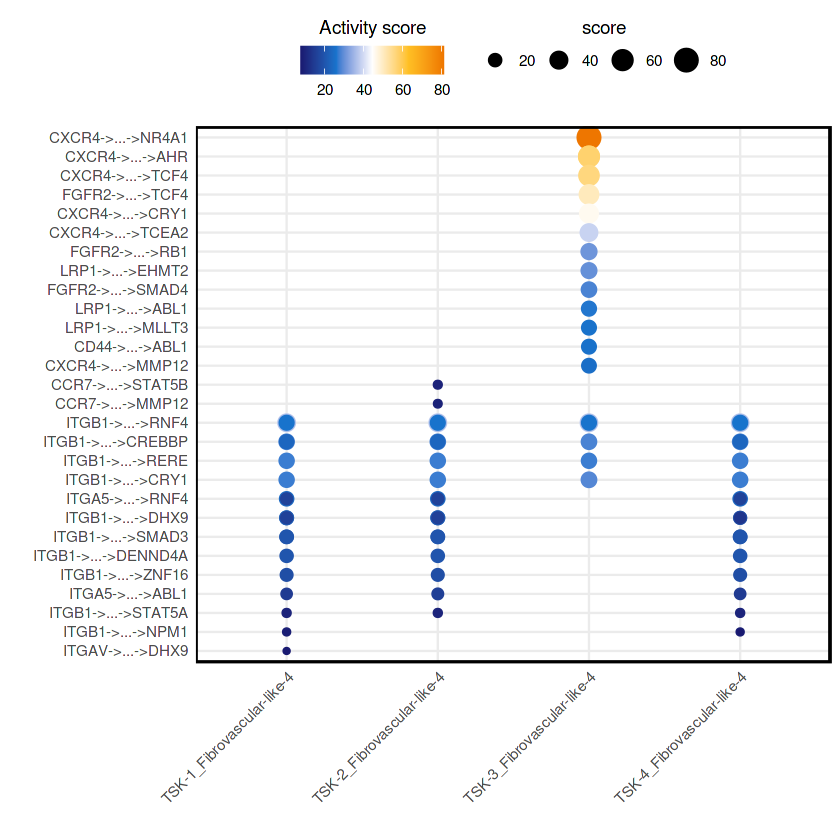

In [44]:
options(repr.plot.width = 7, repr.plot.height = 7)
a1 <- signaling2TF(npaths, num.pathways = 20, interaction = tumor[1])
a2 <- signaling2TF(npaths, num.pathways = 20, interaction = tumor[2])
a3 <- signaling2TF(npaths, num.pathways = 20, interaction = tumor[3])
a4 <- signaling2TF(npaths, num.pathways = 20, interaction = tumor[4])
combined <- do.call(rbind, list(a1$df, a2$df, a3$df, a4$df))

g <- ggplot(combined, aes(path, interaction)) + geom_point(aes(colour=score, size=score)) + #geom_tile(aes(fill = score2)) +
  scale_colour_gradientn("Activity score",colours=c("midnightblue","dodgerblue3","white","goldenrod1","darkorange2")) + theme_bw() +
  xlab("") + ylab("") +
  theme(legend.position="top", axis.text.x = element_text(size=rel(1), angle=45, hjust=1),
        panel.grid.minor = element_blank(),
        axis.ticks=element_blank(),#)+#,
        panel.border=element_rect(fill = NA, colour=alpha('black', 1),size=1)) +
  guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5),
         size = guide_legend(title.position="top", title.hjust = 0.5)) + coord_flip()
g

Fig. 1: Receptor to transcription factor path activity score in tumor to stroma. 

**We found that the spatially-resolved subcluster TSK-3 is a major source of chemokines (*CCL5*, *CLXL10*, *CXCL16*), which bind to *CXCR4* in the perivascular niche, culminating in the downstream transcriptional regulators *NR4A1*, *AHR*, *TCF4*, *TCEA2* and *MMP12* (and others), which are enriched in extracellular matrix remodeling and endothelial differentiation processes, consistent with processes identified by the authors of the original publication.**

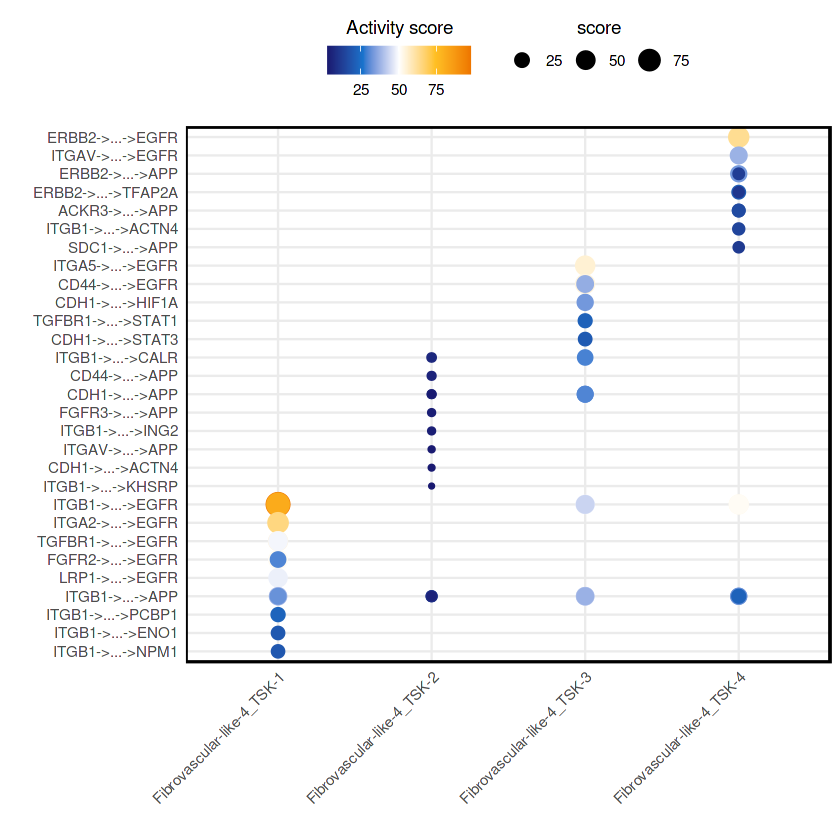

In [45]:
options(repr.plot.width = 7, repr.plot.height = 7)
a5 <- signaling2TF(npaths, num.pathways = 15, interaction = TME[1])
a6 <- signaling2TF(npaths, num.pathways = 15, interaction = TME[2])
a7 <- signaling2TF(npaths, num.pathways = 15, interaction = TME[3])
a8 <- signaling2TF(npaths, num.pathways = 15, interaction = TME[4])
combined <- do.call(rbind, list(a5$df, a6$df, a7$df, a8$df))

g <- ggplot(combined, aes(path, interaction)) + geom_point(aes(colour=score, size=score)) + #geom_tile(aes(fill = score2)) +
  scale_colour_gradientn("Activity score",colours=c("midnightblue","dodgerblue3","white","goldenrod1","darkorange2")) + theme_bw() +
  xlab("") + ylab("") +
  theme(legend.position="top", axis.text.x = element_text(size=rel(1), angle=45, hjust=1),
        panel.grid.minor = element_blank(),
        axis.ticks=element_blank(),#)+#,
        panel.border=element_rect(fill = NA, colour=alpha('black', 1),size=1)) +
  guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5),
         size = guide_legend(title.position="top", title.hjust = 0.5)) + coord_flip()
g

Fig. 1: Receptor to transcription factor path activity score in stroma to tumor. 

In [43]:
save.image(file = "my_step_03.RData")

# **Troubleshooting**

Step: 7
Problem: The function x creates columns in the metadata table that, if run more than once, generates column names different from the desired one, with suffix “.1”, “.2”, etc.
Solution: If the function has been run more than once, it is suggested to delete the columns added in the metadata table.

Step: 19
Problem: Networks with too many elements can cause java to crash.
Solution: Use higher values in the network trimming parameters, corThr1 e corThr2.

# **Time taken**

Time end-to-end for a beginner user should be around 4 hours (the computation of the null distribution/empirical p is the most computationally demanding step and, consequently, takes longer).

# **References**

Ji, A. L. et al. Multimodal Analysis of Composition and Spatial Architecture in Human Squamous Cell Carcinoma. Cell. 182(2), 497-514 (2020).

In [3]:
sessionInfo()

R version 4.1.1 (2021-08-10)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 20.04.2 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/blas/libblas.so.3.9.0
LAPACK: /usr/lib/x86_64-linux-gnu/lapack/liblapack.so.3.9.0

locale:
 [1] LC_CTYPE=C.UTF-8          LC_NUMERIC=C             
 [3] LC_TIME=C.UTF-8           LC_COLLATE=C.UTF-8       
 [5] LC_MONETARY=C.UTF-8       LC_MESSAGES=C.UTF-8      
 [7] LC_PAPER=C.UTF-8          LC_NAME=C.UTF-8          
 [9] LC_ADDRESS=C.UTF-8        LC_TELEPHONE=C.UTF-8     
[11] LC_MEASUREMENT=C.UTF-8    LC_IDENTIFICATION=C.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] IRdisplay_1.0 ggplot2_3.3.5 scales_1.1.1  igraph_1.2.6  fusca_1.3.1  
[6] dplyr_1.0.8  

loaded via a namespace (and not attached):
 [1] Rcpp_1.0.8          pillar_1.7.0        compiler_4.1.1     
 [4] base64enc_0.1-3     tools_4.1.1         mclust_5.4.9       
 [7] digest_0.